# Introduction

## Problem Statement :
In the recent past, the industry of wealth management has seen a lot of growth. Every individual or business actively searches for opportunities to get the maximum returns. However, in most of the cases, they either lack the skills to identify the right investment opportunity, or there is a shortage of time for finding these opportunities. Hence, this gave rise to the dedicated individuals who perform this task on behalf of the investors for a commission - Portfolio managers.

A portfolio manager makes investment decisions and carries out other related activities on behalf of vested investors. They work with a team of analysts and researchers, and their main objective is to realise the needs of the investor and suggest a suitable portfolio that meets all the expectations. They are responsible for establishing the best investment strategy, selecting appropriate investments along with the right allocation. However, in doing so, they face a lot of competition in the form of other portfolio managers and rival firms. Therefore, the portfolio manager has to use the available resources to provide the best solution to the investor.

Consider ourselves working for an associate at an investment firm that manages accounts for private clients. Our role requires you to analyse a portfolio of stocks to provide consultation on investment management based on client’s requirement.

## Business Goal :
As a portfolio manager, our task is to provide consultation to two different investors, Mr. Patrick Jyengar and Mr. Peter Jyengar based on their requirements and financial objectives.

The goal of the case study is :
- To Suggest a Portfolio of stocks to Mr. Patrick Jyengar based on his risk profile to meet his goal of doubling the amount of 500K Dollars in five years of a timespan to buy a minority stake in Naturo.
- To Suggest a High-risk stock to Mr. Peter Jyengar based on his risk profile to meet his goal of gaining higher returns for the invested amount of 1 Million Dollars over five years of a timespan to use it for the expansion of JWW.


In [1]:
#Data Analysis & Data wrangling Libraries
import numpy as np
import pandas as pd
from collections import Counter
from functools import reduce
from datetime import datetime
from scipy import stats

# Standard plotly imports
import chart_studio.plotly as py
import plotly.graph_objs as go
from plotly.offline import iplot, init_notebook_mode

#Visualization Libraries
import matplotlib.pyplot as plt
import matplotlib.style as style
import seaborn as sns
%matplotlib inline

# Plot Style
sns.set_context("paper")
style.use('fivethirtyeight')

# Machine Learning Libraries

#Sci-kit learn libraries

from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error


#statsmodel libraries
from statsmodels.stats.outliers_influence import variance_inflation_factor
import statsmodels.api as sm
from pylab import rcParams

# Supress the Warnings
import warnings
warnings.filterwarnings("ignore")
%matplotlib inline

sns.set_theme()
pd.set_option('display.max_columns', None)
import math

## Importing Data

### Aviation

In [2]:
#Importing Aviation Data - AAL
AAL = pd.read_csv('AAL.csv')

#Importing Aviation Data - ALGT
ALGT = pd.read_csv('ALGT.csv')

#Importing Aviation Data - ALK
ALK = pd.read_csv('ALK.csv')

#Importing Aviation Data - DAL
DAL = pd.read_csv('DAL.csv')

#Importing Aviation Data - HA
HA = pd.read_csv('HA.csv')

#Importing Aviation Data - LUV
LUV = pd.read_csv('LUV.csv')

### Finance

In [3]:
#Importing Finance Data - BCS
BCS = pd.read_csv('BCS.csv')

#Importing Finance Data - CS
CS = pd.read_csv('CS.csv')

#Importing Finance Data - DB
DB = pd.read_csv('DB.csv')

#Importing Finance Data - GS
GS = pd.read_csv('GS.csv')

#Importing Finance Data - MS
MS = pd.read_csv('MS.csv')

#Importing Finance Data - WFC
WFC = pd.read_csv('WFC.csv')

### Pharma HealthCare

In [4]:
#Importing Pharma_Healthcare Data - BHC
BHC = pd.read_csv('BHC.csv')

#Importing Healthcare_Pharma Data - JNJ
JNJ= pd.read_csv('JNJ.csv')

#Importing Healthcare_Pharma Data - MRK
MRK = pd.read_csv('MRK.csv')

#Importing Healthcare_Pharma Data - PFE
PFE = pd.read_csv('PFE.csv')

#Importing Healthcare_Pharma Data - RHHBY
RHHBY = pd.read_csv('RHHBY.csv')

#Importing Healthcare_Pharma Data - UNH
UNH = pd.read_csv('UNH.csv')

### Technology

In [5]:
#Importing Technology Data - AAPL
AAPL = pd.read_csv('AAPL.csv')

#Importing Technology Data - AMZN
AMZN = pd.read_csv('AMZN.csv')

#Importing Technology Data - FB
FB = pd.read_csv('FB.csv')

#Importing Technology Data - GOOG
GOOG = pd.read_csv('GOOG.csv')

#Importing Technology Data - IBM
IBM = pd.read_csv('IBM.csv')

#Importing Technology Data - MSFT
MSFT = pd.read_csv('MSFT.csv')

### Market Reference

In [6]:
# Importing Csv file of the market reference (S&P500)
SP500 = pd.read_csv('S&P500.csv')
SP500.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,01-10-2010,1143.489990,1150.300049,1139.420044,1146.239990,1146.239990,4298910000
1,04-10-2010,1144.959961,1148.160034,1131.869995,1137.030029,1137.030029,3604110000
2,05-10-2010,1140.680054,1162.760010,1140.680054,1160.750000,1160.750000,4068840000
3,06-10-2010,1159.810059,1162.329956,1154.849976,1159.969971,1159.969971,4073160000
4,07-10-2010,1161.569946,1163.869995,1151.410034,1158.060059,1158.060059,3910550000


In [7]:
#For showing all outputs in one cell 
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

## Data Cleaning & Manipulation

### Previewing Data - Aviation

In [8]:
AAL.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,01-10-2010,9.29,9.39,9.21,9.29,8.758067,3603800
1,04-10-2010,9.24,9.48,9.05,9.12,8.597802,3856800
2,05-10-2010,9.27,9.35,9.15,9.23,8.701504,3896600
3,06-10-2010,9.27,9.40,9.15,9.23,8.701504,3230200
4,07-10-2010,9.30,9.31,9.07,9.24,8.710930,3877700


In [9]:
ALGT.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,01-10-2010,42.779999,43.259998,41.869999,43.230000,36.766212,159100.0
1,04-10-2010,43.250000,43.330002,41.310001,41.590000,35.371429,189700.0
2,05-10-2010,41.779999,42.130001,41.299999,42.099998,35.805168,175000.0
3,06-10-2010,42.080002,42.349998,41.349998,41.950001,35.677608,187200.0
4,07-10-2010,42.259998,42.270000,41.500000,41.700001,35.464993,162700.0


In [10]:
ALK.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,01-10-2010,12.9325,12.9625,12.3675,12.4475,10.972344,1663600.0
1,04-10-2010,12.4300,12.5900,11.9975,12.1425,10.703489,1512400.0
2,05-10-2010,12.2600,12.2850,11.9450,12.2150,10.767396,2567200.0
3,06-10-2010,12.2200,12.3950,12.0875,12.1875,10.743157,1043600.0
4,07-10-2010,12.2775,12.3450,11.2150,11.6250,10.247319,7682400.0


In [11]:
DAL.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,01-10-2010,11.75,12.01,11.71,12.01,10.668407,9094900.0
1,04-10-2010,11.70,12.01,11.45,11.51,10.224259,7916400.0
2,05-10-2010,11.57,11.87,11.45,11.83,10.508514,12624100.0
3,06-10-2010,11.87,12.05,11.56,11.78,10.464101,10124100.0
4,07-10-2010,11.80,11.82,11.61,11.77,10.455217,7162500.0


In [12]:
HA.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,01-10-2010,6.02,6.05,5.88,5.96,5.742526,645400.0
1,04-10-2010,5.96,6.00,5.73,5.75,5.540189,618900.0
2,05-10-2010,5.82,5.93,5.77,5.85,5.636539,534800.0
3,06-10-2010,5.85,6.05,5.85,5.97,5.752162,2563900.0
4,07-10-2010,6.04,6.32,5.98,6.15,5.925593,1115200.0


In [13]:
LUV.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,01-10-2010,13.23,13.24,12.92,12.94,12.018754,5722500.0
1,04-10-2010,12.92,13.09,12.62,12.82,11.907295,6537700.0
2,05-10-2010,12.97,13.16,12.94,13.02,12.093060,8060000.0
3,06-10-2010,12.96,13.10,12.72,12.94,12.018754,7457000.0
4,07-10-2010,12.98,13.03,12.85,12.88,11.963027,3413900.0


### Previewing Data - Finance

In [14]:
BCS.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,04-01-2010,16.709677,16.930876,16.663595,16.894009,12.665321,2144300.0
1,05-01-2010,17.631336,17.852535,17.520737,17.824884,13.363193,2710600.0
2,06-01-2010,17.797235,18.202765,17.695852,18.129032,13.591214,2124100.0
3,07-01-2010,18.617512,18.884792,18.506912,18.801844,14.095612,3932100.0
4,08-01-2010,18.986176,19.124424,18.755760,18.967741,14.219986,3055200.0


In [15]:
CS.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,04-01-2010,49.902344,51.035156,49.765625,50.771484,34.852165,734200.0
1,05-01-2010,51.250000,51.318359,50.644531,51.191406,35.140423,447700.0
2,06-01-2010,50.224609,50.917969,49.951172,50.478516,34.651054,751200.0
3,07-01-2010,51.250000,52.646484,51.201172,52.519531,36.052116,833700.0
4,08-01-2010,52.548828,53.339844,52.441406,53.291016,36.581703,706900.0


In [16]:
DB.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,04-01-2010,69.103050,70.162216,68.893127,69.875954,59.037861,469500.0
1,05-01-2010,71.412216,71.698471,70.610687,71.211830,60.166534,503300.0
2,06-01-2010,69.847328,70.543892,69.494278,69.980919,59.126545,495000.0
3,07-01-2010,70.133591,70.896950,69.809158,70.772903,59.795689,700100.0
4,08-01-2010,72.891220,73.416031,72.509544,73.330154,61.956295,763900.0


In [17]:
GS.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,04-01-2010,170.050003,174.250000,169.509995,173.080002,147.920776,9135000.0
1,05-01-2010,173.000000,176.259995,172.570007,176.139999,150.535919,11659400.0
2,06-01-2010,175.380005,175.380005,173.759995,174.259995,148.929138,7381100.0
3,07-01-2010,174.320007,178.750000,173.949997,177.669998,151.843475,8727400.0
4,08-01-2010,176.330002,177.429993,173.949997,174.309998,148.971909,7268100.0


In [18]:
MS.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,04-01-2010,30.700001,31.969999,30.629999,30.910000,25.759523,20371000.0
1,05-01-2010,31.010000,32.130001,30.930000,32.040001,26.701244,22523400.0
2,06-01-2010,31.969999,32.590000,31.790001,32.450001,27.042919,17028500.0
3,07-01-2010,32.459999,33.270000,32.270000,32.919998,27.434603,18693000.0
4,08-01-2010,32.599998,32.820000,31.980000,32.250000,26.876251,15993400.0


In [19]:
WFC.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,04-01-2010,27.020000,27.48,26.820000,27.320000,20.318752,39335700.0
1,05-01-2010,27.270000,28.24,27.240000,28.070000,20.876556,55416000.0
2,06-01-2010,28.030001,28.33,27.790001,28.110001,20.906300,33237000.0
3,07-01-2010,28.120001,29.43,27.920000,29.129999,21.664902,61649000.0
4,08-01-2010,28.900000,29.35,28.600000,28.860001,21.464094,35508700.0


### Previewing Data - Pharma HealthCare

In [20]:
BHC.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,01-10-2010,25.120001,25.879999,25.100000,25.750000,24.757708,5778700.0
1,04-10-2010,25.750000,25.990000,25.590000,25.870001,24.873083,4187200.0
2,05-10-2010,26.040001,26.330000,25.830000,26.299999,25.286512,4610300.0
3,06-10-2010,26.150000,26.879999,26.049999,26.690001,25.661484,4448900.0
4,07-10-2010,26.700001,26.910000,26.440001,26.600000,25.574951,2453900.0


In [21]:
JNJ.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,01-10-2010,62.090000,62.250000,61.570000,61.750000,45.970119,9773200.0
1,04-10-2010,61.540001,61.980000,61.299999,61.669998,45.910553,8703600.0
2,05-10-2010,62.080002,62.939999,62.009998,62.799999,46.751797,12439400.0
3,06-10-2010,62.889999,63.259998,62.500000,63.209999,47.057022,11339800.0
4,07-10-2010,63.290001,63.500000,63.000000,63.220001,47.064480,9826600.0


In [22]:
MRK.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,01-10-2010,36.759998,36.840000,36.349998,36.599998,26.052284,11741900.0
1,04-10-2010,36.490002,36.750000,36.290001,36.520000,25.995331,9234900.0
2,05-10-2010,36.860001,37.150002,36.700001,37.020000,26.351234,10669200.0
3,06-10-2010,37.040001,37.220001,36.820000,37.009998,26.344130,7541300.0
4,07-10-2010,37.349998,37.389999,36.630001,36.709999,26.130579,13897800.0


In [23]:
PFE.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,01-10-2010,17.250000,17.290001,17.110001,17.180000,11.900640,35520800.0
1,04-10-2010,17.100000,17.200001,16.860001,16.900000,11.706684,40665800.0
2,05-10-2010,17.110001,17.250000,17.059999,17.230000,11.935278,44694000.0
3,06-10-2010,17.240000,17.379999,17.170000,17.260000,11.956057,35688300.0
4,07-10-2010,17.379999,17.510000,17.320000,17.379999,12.039181,38556300.0


In [24]:
RHHBY.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,01-10-2010,17.200001,17.450001,17.190001,17.389999,10.770474,1405600.0
1,04-10-2010,17.305000,17.344999,17.225000,17.275000,10.699248,453600.0
2,05-10-2010,17.575001,17.815001,17.549999,17.799999,11.024405,1406200.0
3,06-10-2010,17.959999,18.000000,17.875000,17.975000,11.132792,709800.0
4,07-10-2010,18.075001,18.100000,17.844999,17.930000,11.104921,709000.0


In [25]:
UNH.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,01-10-2010,35.070000,35.470001,34.759998,35.430000,30.229097,6503500.0
1,04-10-2010,35.299999,35.299999,34.349998,34.540001,29.469746,5883300.0
2,05-10-2010,34.770000,35.130001,34.549999,35.070000,29.921938,6887400.0
3,06-10-2010,35.040001,35.220001,33.939999,33.950001,28.966356,13815400.0
4,07-10-2010,34.389999,34.590000,34.110001,34.340000,29.299112,6878900.0


### Previewing Data - Technology 

In [26]:
AAPL.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,01-10-2010,10.219643,10.235000,10.048214,10.090000,8.719163,448142800
1,04-10-2010,10.057143,10.103572,9.920357,9.951428,8.599421,435302000
2,05-10-2010,10.071428,10.337500,10.065000,10.319285,8.917298,501967200
3,06-10-2010,10.342500,10.428214,10.187857,10.328215,8.925013,670868800
4,07-10-2010,10.369286,10.374286,10.246786,10.329286,8.925941,408399600


In [27]:
AMZN.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,01-10-2010,157.080002,157.440002,152.199997,153.710007,153.710007,8683400.0
1,04-10-2010,153.949997,155.960007,152.789993,155.389999,155.389999,5346500.0
2,05-10-2010,157.080002,161.210007,157.009995,160.869995,160.869995,5620000.0
3,06-10-2010,160.600006,160.679993,154.600006,155.399994,155.399994,6060800.0
4,07-10-2010,156.509995,157.399994,153.389999,156.270004,156.270004,4622000.0


In [28]:
FB.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,18-05-2012,42.049999,45.000000,38.000000,38.230000,38.230000,573576400.0
1,21-05-2012,36.529999,36.660000,33.000000,34.029999,34.029999,168192700.0
2,22-05-2012,32.610001,33.590000,30.940001,31.000000,31.000000,101786600.0
3,23-05-2012,31.370001,32.500000,31.360001,32.000000,32.000000,73600000.0
4,24-05-2012,32.950001,33.209999,31.770000,33.029999,33.029999,50237200.0


In [29]:
GOOG.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,01-10-2010,264.010437,264.319275,260.523499,261.828613,261.828613,4466600.0
1,04-10-2010,261.494843,263.138702,258.456238,260.199707,260.199707,3895400.0
2,05-10-2010,263.203461,268.991760,262.291870,268.110046,268.110046,7040400.0
3,06-10-2010,268.623138,268.966858,263.980530,266.177307,266.177307,5545200.0
4,07-10-2010,267.103821,267.596985,263.582031,264.015411,264.015411,4809400.0


In [30]:
IBM.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,01-10-2010,135.509995,136.279999,135.089996,135.639999,97.152512,5621200.0
1,04-10-2010,135.229996,135.919998,134.389999,135.250000,96.873192,4059900.0
2,05-10-2010,136.179993,137.899994,136.119995,137.660004,98.599335,6202500.0
3,06-10-2010,136.880005,137.960007,136.830002,137.839996,98.728279,4783000.0
4,07-10-2010,137.919998,138.880005,137.520004,138.720001,99.358559,6440800.0


In [31]:
MSFT.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,01-10-2010,24.770000,24.820000,24.299999,24.379999,19.315863,62672300.0
1,04-10-2010,23.959999,23.990000,23.780001,23.910000,18.943493,98143400.0
2,05-10-2010,24.059999,24.450001,23.910000,24.350000,19.292101,78152900.0
3,06-10-2010,24.320000,24.540001,24.129999,24.430000,19.355482,50489700.0
4,07-10-2010,24.620001,24.750000,24.280001,24.530001,19.434708,50096100.0


### Dropping Rows only if all the values are Null

In [32]:
AAL.dropna(how='all',inplace = True)
ALGT.dropna(how='all',inplace = True)
ALK.dropna(how='all',inplace = True)
DAL.dropna(how='all',inplace = True)
HA.dropna(how='all',inplace = True)
LUV.dropna(how='all',inplace = True)
BCS.dropna(how='all',inplace = True)
CS.dropna(how='all',inplace = True)
DB.dropna(how='all',inplace = True)
GS.dropna(how='all',inplace = True)
MS.dropna(how='all',inplace = True)
WFC.dropna(how='all',inplace = True)
BHC.dropna(how='all',inplace = True)
JNJ.dropna(how='all',inplace = True)
MRK.dropna(how='all',inplace = True)
PFE.dropna(how='all',inplace = True)
RHHBY.dropna(how='all',inplace = True)
UNH.dropna(how='all',inplace = True)
AAPL.dropna(how='all',inplace = True)
AMZN.dropna(how='all',inplace = True)
FB.dropna(how='all',inplace = True)
GOOG.dropna(how='all',inplace = True)
IBM.dropna(how='all',inplace = True)
MSFT.dropna(how='all',inplace = True)
SP500.dropna(how='all',inplace = True)

### Keeping necessary coloumns

In [33]:
AAL = AAL[['Date','Close','Volume']]
ALGT = ALGT[['Date','Close','Volume']]
ALK = ALK[['Date','Close','Volume']]
DAL = DAL[['Date','Close','Volume']]
HA = HA[['Date','Close','Volume']]
LUV = LUV[['Date','Close','Volume']]
BCS = BCS[['Date','Close','Volume']]
CS = CS[['Date','Close','Volume']]
DB = DB[['Date','Close','Volume']]
GS = GS[['Date','Close','Volume']]
MS = MS[['Date','Close','Volume']]
WFC = WFC[['Date','Close','Volume']]
BHC = BHC[['Date','Close','Volume']]
JNJ = JNJ[['Date','Close','Volume']]
MRK = MRK[['Date','Close','Volume']]
PFE = PFE[['Date','Close','Volume']]
RHHBY = RHHBY[['Date','Close','Volume']]
UNH = UNH[['Date','Close','Volume']]
AAPL = AAPL[['Date','Close','Volume']]
AMZN = AMZN[['Date','Close','Volume']]
MSFT = MSFT[['Date','Close','Volume']]
FB = FB[['Date','Close','Volume']]
GOOG = GOOG[['Date','Close','Volume']]
IBM = IBM[['Date','Close','Volume']]
MSFT = MSFT[['Date','Close','Volume']]
SP500 = SP500[['Date','Close','Volume']]

### Adding suffix to the columns of the dataframe
For better readability specially after merging the coloumns we are adding suffix to identify which coloumn belongs to which stock.

In [34]:
SP500.columns = SP500.columns.map(lambda x : x + '_SP500' if x !='Date'else x)
AAL.columns = AAL.columns.map(lambda x : x + '_AAL' if x !='Date'else x)
ALGT.columns = ALGT.columns.map(lambda x : x + '_ALGT' if x !='Date'else x)
ALK.columns = ALK.columns.map(lambda x : x + '_ALK' if x !='Date'else x)
DAL.columns = DAL.columns.map(lambda x : x + '_DAL' if x !='Date'else x)
HA.columns = HA.columns.map(lambda x : x + '_HA' if x !='Date'else x)
LUV.columns = LUV.columns.map(lambda x : x + '_LUV' if x !='Date'else x)
BCS.columns = BCS.columns.map(lambda x : x + '_BCS' if x !='Date'else x)
CS.columns = CS.columns.map(lambda x : x + '_CS' if x !='Date'else x)
DB.columns = DB.columns.map(lambda x : x + '_DB' if x !='Date'else x)
GS.columns = GS.columns.map(lambda x : x + '_GS' if x !='Date'else x)
MS.columns = MS.columns.map(lambda x : x + '_MS' if x !='Date'else x)
WFC.columns = WFC.columns.map(lambda x : x + '_WFC' if x !='Date'else x)
BHC.columns = BHC.columns.map(lambda x : x + '_BHC' if x !='Date'else x)
JNJ.columns = JNJ.columns.map(lambda x : x + '_JNJ' if x !='Date'else x)
MRK.columns = MRK.columns.map(lambda x : x + '_MRK' if x !='Date'else x)
PFE.columns = PFE.columns.map(lambda x : x + '_PFE' if x !='Date'else x)
RHHBY.columns = RHHBY.columns.map(lambda x : x + '_RHHBY' if x !='Date'else x)
UNH.columns = UNH.columns.map(lambda x : x + '_UNH' if x !='Date'else x)
AAPL.columns = AAPL.columns.map(lambda x : x + '_AAPL' if x !='Date'else x)
AMZN.columns = AMZN.columns.map(lambda x : x + '_AMZN' if x !='Date'else x)
FB.columns = FB.columns.map(lambda x : x + '_FB' if x !='Date'else x)
GOOG.columns = GOOG.columns.map(lambda x : x + '_GOOG' if x !='Date'else x)
IBM.columns = IBM.columns.map(lambda x : x + '_IBM' if x !='Date'else x)
MSFT.columns = MSFT.columns.map(lambda x : x + '_MSFT' if x !='Date'else x)

### Missing values treatment
Checking if there are any missing values in the selected coloumns.

In [35]:
print('No missing data --> SP500') if sum(SP500.isnull().sum()) == 0 else (SP500.isnull().sum())/len(SP500)
print('No missing data --> AAL') if sum(AAL.isnull().sum()) == 0 else (AAL.isnull().sum())/len(AAL)
print('No missing data --> ALGT') if sum(ALGT.isnull().sum()) == 0 else (ALGT.isnull().sum())/len(ALGT)
print('No missing data --> ALK') if sum(ALK.isnull().sum()) == 0 else (ALK.isnull().sum())/len(ALK)
print('No missing data --> DAL') if sum(DAL.isnull().sum()) == 0 else (DAL.isnull().sum())/len(DAL)
print('No missing data --> HA') if sum(HA.isnull().sum()) == 0 else (HA.isnull().sum())/len(HA)
print('No missing data --> LUV') if sum(LUV.isnull().sum()) == 0 else (LUV.isnull().sum())/len(LUV)
print('No missing data --> BCS') if sum(BCS.isnull().sum()) == 0 else (BCS.isnull().sum())/len(BCS)
print('No missing data --> Cs') if sum(CS.isnull().sum()) == 0 else (CS.isnull().sum())/len(CS)
print('No missing data --> DB') if sum(DB.isnull().sum()) == 0 else (DB.isnull().sum())/len(DB)
print('No missing data --> GS') if sum(GS.isnull().sum()) == 0 else (GS.isnull().sum())/len(GS)
print('No missing data --> MS') if sum(MS.isnull().sum()) == 0 else (MS.isnull().sum())/len(MS)
print('No missing data --> WFC ') if sum(WFC.isnull().sum()) == 0 else (WFC.isnull().sum())/len(WFC)
print('No missing data --> BHC') if sum(BHC.isnull().sum()) == 0 else (BHC.isnull().sum())/len(BHC)
print('No missing data --> JNJ') if sum(JNJ.isnull().sum()) == 0 else (JNJ.isnull().sum())/len(JNJ)
print('No missing data --> MRK') if sum(MRK.isnull().sum()) == 0 else (MRK.isnull().sum())/len(MRK)
print('No missing data --> PFE') if sum(PFE.isnull().sum()) == 0 else (PFE.isnull().sum())/len(PFE)
print('No missing data --> RHHBY') if sum(RHHBY.isnull().sum()) == 0 else (RHHBY.isnull().sum())/len(RHHBY)
print('No missing data --> UNH') if sum(UNH.isnull().sum()) == 0 else (UNH.isnull().sum())/len(UNH)
print('No missing data --> AAPL') if sum(AAPL.isnull().sum()) == 0 else (AAPL.isnull().sum())/len(AAPL)
print('No missing data --> AMZN') if sum(AMZN.isnull().sum()) == 0 else (AMZN.isnull().sum())/len(AMZN)
print('No missing data --> FB') if sum(FB.isnull().sum()) == 0 else (FB.isnull().sum())/len(FB)
print('No missing data --> GOOG') if sum(GOOG.isnull().sum()) == 0 else (GOOG.isnull().sum())/len(GOOG)
print('No missing data --> IBM') if sum(IBM.isnull().sum()) == 0 else (IBM.isnull().sum())/len(IBM)
print('No missing data --> MSFT') if sum(MSFT.isnull().sum()) == 0 else (MSFT.isnull().sum())/len(MSFT)

No missing data --> SP500
No missing data --> AAL
No missing data --> ALGT
No missing data --> ALK
No missing data --> DAL
No missing data --> HA
No missing data --> LUV
No missing data --> BCS
No missing data --> Cs
No missing data --> DB
No missing data --> GS
No missing data --> MS
No missing data --> WFC 
No missing data --> BHC
No missing data --> JNJ
No missing data --> MRK
No missing data --> PFE
No missing data --> RHHBY
No missing data --> UNH
No missing data --> AAPL
No missing data --> AMZN
No missing data --> FB
No missing data --> GOOG
No missing data --> IBM
No missing data --> MSFT


#### Observation:
There are no missing values in the of the datasets.

### Merging the dataframes of All Industry and inspecting the dataframe

In [36]:
aviation  = AAL.merge(ALGT, on='Date',how='inner').merge(ALK, on='Date',how='inner').merge(DAL, on='Date',how='inner').merge(HA, on='Date',how='inner').merge(LUV, on='Date',how='inner')

finance  = BCS.merge(CS, on='Date',how='inner').merge(DB, on='Date',how='inner').merge(GS, on='Date',how='inner').merge(MS, on='Date',how='inner').merge(WFC, on='Date',how='inner')

healthcare = BHC.merge(JNJ, on='Date',how='inner').merge(MRK, on='Date',how='inner').merge(PFE, on='Date',how='inner').merge(RHHBY, on='Date',how='inner').merge(UNH, on='Date',how='inner')

technology = AAPL.merge(AMZN, on='Date',how='inner').merge(FB, on='Date',how='inner').merge(GOOG, on='Date',how='inner').merge(IBM, on='Date',how='inner').merge(MSFT, on='Date',how='inner')

In [37]:
#Merging the dataframes of All Industry and inspecting the dataframe
aviation.head()
finance.head() 
healthcare.head()
technology.head()

,Date,Close_AAL,Volume_AAL,Close_ALGT,Volume_ALGT,Close_ALK,Volume_ALK,Close_DAL,Volume_DAL,Close_HA,Volume_HA,Close_LUV,Volume_LUV
0,01-10-2010,9.29,3603800,43.230000,159100.0,12.4475,1663600.0,12.01,9094900.0,5.96,645400.0,12.94,5722500.0
1,04-10-2010,9.12,3856800,41.590000,189700.0,12.1425,1512400.0,11.51,7916400.0,5.75,618900.0,12.82,6537700.0
2,05-10-2010,9.23,3896600,42.099998,175000.0,12.2150,2567200.0,11.83,12624100.0,5.85,534800.0,13.02,8060000.0
3,06-10-2010,9.23,3230200,41.950001,187200.0,12.1875,1043600.0,11.78,10124100.0,5.97,2563900.0,12.94,7457000.0
4,07-10-2010,9.24,3877700,41.700001,162700.0,11.6250,7682400.0,11.77,7162500.0,6.15,1115200.0,12.88,3413900.0


,Date,Close_BCS,Volume_BCS,Close_CS,Volume_CS,Close_DB,Volume_DB,Close_GS,Volume_GS,Close_MS,Volume_MS,Close_WFC,Volume_WFC
0,04-01-2010,16.894009,2144300.0,50.771484,734200.0,69.875954,469500.0,173.080002,9135000.0,30.910000,20371000.0,27.320000,39335700.0
1,05-01-2010,17.824884,2710600.0,51.191406,447700.0,71.211830,503300.0,176.139999,11659400.0,32.040001,22523400.0,28.070000,55416000.0
2,06-01-2010,18.129032,2124100.0,50.478516,751200.0,69.980919,495000.0,174.259995,7381100.0,32.450001,17028500.0,28.110001,33237000.0
3,07-01-2010,18.801844,3932100.0,52.519531,833700.0,70.772903,700100.0,177.669998,8727400.0,32.919998,18693000.0,29.129999,61649000.0
4,08-01-2010,18.967741,3055200.0,53.291016,706900.0,73.330154,763900.0,174.309998,7268100.0,32.250000,15993400.0,28.860001,35508700.0


,Date,Close_BHC,Volume_BHC,Close_JNJ,Volume_JNJ,Close_MRK,Volume_MRK,Close_PFE,Volume_PFE,Close_RHHBY,Volume_RHHBY,Close_UNH,Volume_UNH
0,01-10-2010,25.750000,5778700.0,61.750000,9773200.0,36.599998,11741900.0,17.180000,35520800.0,17.389999,1405600.0,35.430000,6503500.0
1,04-10-2010,25.870001,4187200.0,61.669998,8703600.0,36.520000,9234900.0,16.900000,40665800.0,17.275000,453600.0,34.540001,5883300.0
2,05-10-2010,26.299999,4610300.0,62.799999,12439400.0,37.020000,10669200.0,17.230000,44694000.0,17.799999,1406200.0,35.070000,6887400.0
3,06-10-2010,26.690001,4448900.0,63.209999,11339800.0,37.009998,7541300.0,17.260000,35688300.0,17.975000,709800.0,33.950001,13815400.0
4,07-10-2010,26.600000,2453900.0,63.220001,9826600.0,36.709999,13897800.0,17.379999,38556300.0,17.930000,709000.0,34.340000,6878900.0


,Date,Close_AAPL,Volume_AAPL,Close_AMZN,Volume_AMZN,Close_FB,Volume_FB,Close_GOOG,Volume_GOOG,Close_IBM,Volume_IBM,Close_MSFT,Volume_MSFT
0,18-05-2012,18.942142,732292400,213.850006,5231700.0,38.230000,573576400.0,299.078979,11991700.0,195.880005,5737100.0,29.270000,56205300.0
1,21-05-2012,20.045713,631106000,218.110001,3579800.0,34.029999,168192700.0,305.908386,6173800.0,197.759995,3831700.0,29.750000,38787900.0
2,22-05-2012,19.891787,694870400,215.330002,3733100.0,31.000000,101786600.0,299.278229,6126600.0,196.820007,3567100.0,29.760000,39504900.0
3,23-05-2012,20.377142,584897600,217.279999,4243800.0,32.000000,73600000.0,303.592072,6379900.0,196.119995,4100000.0,29.110001,65171000.0
4,24-05-2012,20.190001,496230000,215.240005,3141100.0,33.029999,50237200.0,300.702881,3796600.0,196.089996,3569300.0,29.070000,52575000.0


#### Observation:
As seen above the dataframes have been merged properly in their respective domains.

### Merging all the dataframes along with the Market Reference (S&P500) in to one single file for further analysis.

In [38]:
AllStocks=aviation.merge(finance, on='Date',how='inner').merge(healthcare, on='Date',how='inner').merge(technology,on='Date',how='inner').merge(SP500,on='Date',how='inner')
AllStocks.head()

,Date,Close_AAL,Volume_AAL,Close_ALGT,Volume_ALGT,Close_ALK,Volume_ALK,Close_DAL,Volume_DAL,Close_HA,Volume_HA,Close_LUV,Volume_LUV,Close_BCS,Volume_BCS,Close_CS,Volume_CS,Close_DB,Volume_DB,Close_GS,Volume_GS,Close_MS,Volume_MS,Close_WFC,Volume_WFC,Close_BHC,Volume_BHC,Close_JNJ,Volume_JNJ,Close_MRK,Volume_MRK,Close_PFE,Volume_PFE,Close_RHHBY,Volume_RHHBY,Close_UNH,Volume_UNH,Close_AAPL,Volume_AAPL,Close_AMZN,Volume_AMZN,Close_FB,Volume_FB,Close_GOOG,Volume_GOOG,Close_IBM,Volume_IBM,Close_MSFT,Volume_MSFT,Close_SP500,Volume_SP500
0,18-05-2012,10.06,10813400,62.310001,167000.0,16.170000,2745800.0,10.14,18994600.0,5.28,525400.0,8.15,15571300.0,10.285714,6799000.0,19.169922,5598100.0,34.370228,3206500.0,95.489998,7184700.0,13.35,37704200.0,30.940001,53576100.0,47.029999,2485300.0,63.349998,13781300.0,37.820000,18690600.0,22.570000,41817300.0,20.160000,1122000.0,53.990002,6420400.0,18.942142,732292400,213.850006,5231700.0,38.230000,573576400.0,299.078979,11991700.0,195.880005,5737100.0,29.270000,56205300.0,1295.219971,4512470000
1,21-05-2012,10.71,8290100,62.660000,150600.0,16.379999,1361600.0,10.58,14203200.0,5.32,327100.0,8.34,12843800.0,10.672812,4476600.0,19.541016,2003100.0,35.505726,3511500.0,96.510002,5314700.0,13.19,32394400.0,31.400000,30865500.0,47.189999,3329800.0,63.470001,8784900.0,37.599998,9300000.0,22.540001,36866800.0,20.389999,438000.0,55.549999,4825900.0,20.045713,631106000,218.110001,3579800.0,34.029999,168192700.0,305.908386,6173800.0,197.759995,3831700.0,29.750000,38787900.0,1315.989990,3786750000
2,22-05-2012,10.62,6227400,62.349998,125500.0,16.225000,1003600.0,10.54,12860300.0,5.23,296000.0,8.27,10105100.0,10.857142,4883500.0,19.863281,3199100.0,35.410305,3134000.0,97.529999,5839700.0,13.31,35996700.0,31.670000,30213700.0,47.779999,2270200.0,63.520000,8409300.0,37.459999,12327600.0,22.370001,35307900.0,20.430000,625400.0,55.720001,5832200.0,19.891787,694870400,215.330002,3733100.0,31.000000,101786600.0,299.278229,6126600.0,196.820007,3567100.0,29.760000,39504900.0,1316.630005,4123680000
3,23-05-2012,11.00,7233000,62.990002,166000.0,16.115000,1626000.0,10.74,9144000.0,5.38,348000.0,8.36,11985600.0,10.737328,4385300.0,19.765625,2216600.0,35.381680,1991200.0,98.040001,5469700.0,13.37,47059000.0,31.740000,30587800.0,46.650002,1978000.0,63.270000,11269100.0,37.340000,11236800.0,22.090000,52062000.0,20.075001,600200.0,55.360001,4671800.0,20.377142,584897600,217.279999,4243800.0,32.000000,73600000.0,303.592072,6379900.0,196.119995,4100000.0,29.110001,65171000.0,1318.859985,4108330000
4,24-05-2012,12.16,17085400,64.250000,148000.0,16.920000,1953800.0,11.27,19379500.0,5.68,567300.0,8.74,15191400.0,10.746544,4550500.0,19.658203,1432400.0,34.828243,1662700.0,96.860001,5177300.0,13.31,26212200.0,31.809999,23765100.0,48.040001,1905800.0,63.099998,9309400.0,37.599998,8651700.0,22.139999,26165200.0,19.855000,590600.0,56.220001,7192400.0,20.190001,496230000,215.240005,3141100.0,33.029999,50237200.0,300.702881,3796600.0,196.089996,3569300.0,29.070000,52575000.0,1320.680054,3937670000


In [39]:
# Checking the shape of the dataframe
AllStocks.shape

(2106, 51)

In [40]:
# Dropping duplicate rows
AllStocks.drop_duplicates()

,Date,Close_AAL,Volume_AAL,Close_ALGT,Volume_ALGT,Close_ALK,Volume_ALK,Close_DAL,Volume_DAL,Close_HA,Volume_HA,Close_LUV,Volume_LUV,Close_BCS,Volume_BCS,Close_CS,Volume_CS,Close_DB,Volume_DB,Close_GS,Volume_GS,Close_MS,Volume_MS,Close_WFC,Volume_WFC,Close_BHC,Volume_BHC,Close_JNJ,Volume_JNJ,Close_MRK,Volume_MRK,Close_PFE,Volume_PFE,Close_RHHBY,Volume_RHHBY,Close_UNH,Volume_UNH,Close_AAPL,Volume_AAPL,Close_AMZN,Volume_AMZN,Close_FB,Volume_FB,Close_GOOG,Volume_GOOG,Close_IBM,Volume_IBM,Close_MSFT,Volume_MSFT,Close_SP500,Volume_SP500
0,18-05-2012,10.06,10813400,62.310001,167000.0,16.170000,2745800.0,10.140000,18994600.0,5.28,525400.0,8.150000,15571300.0,10.285714,6799000.0,19.169922,5598100.0,34.370228,3206500.0,95.489998,7184700.0,13.350000,37704200.0,30.940001,53576100.0,47.029999,2485300.0,63.349998,13781300.0,37.820000,18690600.0,22.570000,41817300.0,20.160000,1122000.0,53.990002,6420400.0,18.942142,732292400,213.850006,5231700.0,38.230000,573576400.0,299.078979,11991700.0,195.880005,5737100.0,29.270000,56205300.0,1295.219971,4512470000
1,21-05-2012,10.71,8290100,62.660000,150600.0,16.379999,1361600.0,10.580000,14203200.0,5.32,327100.0,8.340000,12843800.0,10.672812,4476600.0,19.541016,2003100.0,35.505726,3511500.0,96.510002,5314700.0,13.190000,32394400.0,31.400000,30865500.0,47.189999,3329800.0,63.470001,8784900.0,37.599998,9300000.0,22.540001,36866800.0,20.389999,438000.0,55.549999,4825900.0,20.045713,631106000,218.110001,3579800.0,34.029999,168192700.0,305.908386,6173800.0,197.759995,3831700.0,29.750000,38787900.0,1315.989990,3786750000
2,22-05-2012,10.62,6227400,62.349998,125500.0,16.225000,1003600.0,10.540000,12860300.0,5.23,296000.0,8.270000,10105100.0,10.857142,4883500.0,19.863281,3199100.0,35.410305,3134000.0,97.529999,5839700.0,13.310000,35996700.0,31.670000,30213700.0,47.779999,2270200.0,63.520000,8409300.0,37.459999,12327600.0,22.370001,35307900.0,20.430000,625400.0,55.720001,5832200.0,19.891787,694870400,215.330002,3733100.0,31.000000,101786600.0,299.278229,6126600.0,196.820007,3567100.0,29.760000,39504900.0,1316.630005,4123680000
3,23-05-2012,11.00,7233000,62.990002,166000.0,16.115000,1626000.0,10.740000,9144000.0,5.38,348000.0,8.360000,11985600.0,10.737328,4385300.0,19.765625,2216600.0,35.381680,1991200.0,98.040001,5469700.0,13.370000,47059000.0,31.740000,30587800.0,46.650002,1978000.0,63.270000,11269100.0,37.340000,11236800.0,22.090000,52062000.0,20.075001,600200.0,55.360001,4671800.0,20.377142,584897600,217.279999,4243800.0,32.000000,73600000.0,303.592072,6379900.0,196.119995,4100000.0,29.110001,65171000.0,1318.859985,4108330000
4,24-05-2012,12.16,17085400,64.250000,148000.0,16.920000,1953800.0,11.270000,19379500.0,5.68,567300.0,8.740000,15191400.0,10.746544,4550500.0,19.658203,1432400.0,34.828243,1662700.0,96.860001,5177300.0,13.310000,26212200.0,31.809999,23765100.0,48.040001,1905800.0,63.099998,9309400.0,37.599998,8651700.0,22.139999,26165200.0,19.855000,590600.0,56.220001,7192400.0,20.190001,496230000,215.240005,3141100.0,33.029999,50237200.0,300.702881,3796600.0,196.089996,3569300.0,29.070000,52575000.0,1320.680054,3937670000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2101,24-09-2020,11.77,49163200,121.500000,172300.0,35.700001,3326000.0,29.010000,22257800.0,12.40,879700.0,36.860001,10798800.0,4.750000,5312400.0,9.620000,2347300.0,8.110000,3842200.0,195.110001,5114600.0,46.610001,9832700.0,23.320000,43329100.0,15.220000,5019400.0,144.669998,5614800.0,83.150002,7485000.0,35.759998,19791200.0,44.700001,569600.0,292.660004,2869100.0,108.220001,167743300,3019.790039,5529400.0,249.529999,20006800.0,1428.290039,1450200.0,118.089996,3546200.0,203.190002,31202500.0,3246.590088,4599470000
2102,25-09-2020,12.29,43764000,123.760002,115100.0,36.700001,1767600.0,29.780001,21831500.0,12.80,923400.0,37.099998,9297300.0,4.700000,3185200.0,9.480000,2241100.0,8.

#### Observation:
There are no dulicates coloumns found!

Since we do not need first 5 years data, we shall make a new dataframe for all the stocks with only last 5 years data - From 01/10/2015 to 30/09/2020

### Changing Datatype of Date Field to Datetime for Time-Series analysis

In [41]:
AllStocks['Date']= pd.to_datetime(AllStocks['Date'],infer_datetime_format=True)
AllStocks=AllStocks[(AllStocks['Date']>= '2015-10-01') & (AllStocks['Date']<= '2020-09-30')]

In [42]:
AllStocks.shape

(1259, 51)

### Checking the datatypes

In [43]:
AllStocks.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1259 entries, 847 to 2105
Data columns (total 51 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Date          1259 non-null   datetime64[ns]
 1   Close_AAL     1259 non-null   float64       
 2   Volume_AAL    1259 non-null   int64         
 3   Close_ALGT    1259 non-null   float64       
 4   Volume_ALGT   1259 non-null   float64       
 5   Close_ALK     1259 non-null   float64       
 6   Volume_ALK    1259 non-null   float64       
 7   Close_DAL     1259 non-null   float64       
 8   Volume_DAL    1259 non-null   float64       
 9   Close_HA      1259 non-null   float64       
 10  Volume_HA     1259 non-null   float64       
 11  Close_LUV     1259 non-null   float64       
 12  Volume_LUV    1259 non-null   float64       
 13  Close_BCS     1259 non-null   float64       
 14  Volume_BCS    1259 non-null   float64       
 15  Close_CS      1259 non-null   float6

In [44]:
print('Obeservation: No missing data in ALLStock') if sum(AllStocks.isnull().sum()) == 0 else (AllStocks.isnull().sum())/len(AllStocks)

Obeservation: No missing data in ALLStock


From the above observation, noted that
1. There are no Nulls or missing values in the final data set.
2. Data frame has 1259 rows and 51 columns.
3. Data types are in datetime, int & float types

Data cleaning and manipulation is completed. Hence, data is now ready to be analysed.

## Basic Analysis

###### Perform calculations
Pulling the statistics of dataset for analysis:

- count - no. of rows
- mean (average)
- std (standard deviation)
- min and max
- percentiles 25%, 50%, 75%, 90%, 95% and 99%

In [45]:
AllStocks.describe(percentiles=[.25, .5, .75, .90, .95, .99]).round(2)

,Close_AAL,Volume_AAL,Close_ALGT,Volume_ALGT,Close_ALK,Volume_ALK,Close_DAL,Volume_DAL,Close_HA,Volume_HA,Close_LUV,Volume_LUV,Close_BCS,Volume_BCS,Close_CS,Volume_CS,Close_DB,Volume_DB,Close_GS,Volume_GS,Close_MS,Volume_MS,Close_WFC,Volume_WFC,Close_BHC,Volume_BHC,Close_JNJ,Volume_JNJ,Close_MRK,Volume_MRK,Close_PFE,Volume_PFE,Close_RHHBY,Volume_RHHBY,Close_UNH,Volume_UNH,Close_AAPL,Volume_AAPL,Close_AMZN,Volume_AMZN,Close_FB,Volume_FB,Close_GOOG,Volume_GOOG,Close_IBM,Volume_IBM,Close_MSFT,Volume_MSFT,Close_SP500,Volume_SP500
count,1259.00,1.259000e+03,1259.00,1259.00,1259.00,1259.00,1259.00,1.259000e+03,1259.00,1259.00,1259.00,1.259000e+03,1259.00,1.259000e+03,1259.00,1259.00,1259.00,1259.00,1259.00,1259.00,1259.00,1259.00,1259.00,1.259000e+03,1259.00,1.259000e+03,1259.00,1259.00,1259.00,1259.00,1259.00,1.259000e+03,1259.00,1259.00,1259.00,1259.00,1259.00,1.259000e+03,1259.00,1259.00,1259.00,1.259000e+03,1259.00,1259.00,1259.00,1259.00,1259.00,1.259000e+03,1259.00,1.259000e+03
mean,36.39,1.601068e+07,144.72,180651.95,66.83,1745663.62,48.22,1.188936e+07,35.28,951754.09,49.52,6.842070e+06,9.32,4.082912e+06,14.13,3317422.00,13.59,5406571.88,207.44,3302722.95,42.65,11616211.52,49.04,2.368204e+07,27.87,1.215934e+07,129.05,7266133.60,68.03,10380268.55,36.29,2.535558e+07,33.51,1396070.29,213.13,3703887.37,47.08,1.361416e+08,1426.99,4409569.74,163.61,2.202093e+07,1040.79,1688060.44,143.65,4565081.10,102.19,2.987749e+07,2608.43,3.846638e+09
std,11.49,2.921875e+07,24.91,116695.20,15.35,1331947.84,9.38,1.406011e+07,11.35,569286.15,8.83,6.396727e+06,2.19,5.594151e+06,3.24,2073463.19,5.32,4092102.46,31.60,1572895.70,8.66,5607307.08,9.16,1.344364e+07,24.99,1.408732e+07,13.65,3403720.67,11.55,4710863.71,3.81,1.479752e+07,4.66,1310465.70,59.43,1975694.73,20.99,6.297257e+07,668.36,2152041.05,40.05,1.365298e+07,241.60,777636.10,15.16,2669100.77,45.76,1.452097e+07,394.74,9.821865e+08
min,9.04,1.352400e+06,66.23,38000.00,23.56,270600.00,19.19,1.076000e+06,8.63,161600.00,23.87,1.098400e+06,3.84,8.270000e+05,6.67,401100.00,5.48,0.00,134.97,467700.00,21.69,2087800.00,22.53,4.635500e+06,8.51,7.783000e+05,93.17,2353800.00,48.59,2235900.00,28.49,0.000000e+00,26.39,0.00,109.23,714000.00,22.58,3.247000e+07,482.07,881300.00,90.95,5.913100e+06,611.29,347500.00,94.77,1193000.00,44.61,7.425600e+06,1829.08,1.296540e+09
25%,30.36,5.265450e+06,130.08,110800.00,61.64,1045650.00,45.27,5.748000e+06,27.80,569250.00,42.42,3.847450e+06,8.11,2.278950e+06,12.00,2003900.00,8.70,3140750.00,183.18,2310750.00,38.23,7959650.00,47.33,1.562970e+07,16.83,3.988100e+06,119.64,5346150.00,58.66,7467450.00,33.47,1.719540e+07,30.63,671800.00,160.57,2586700.00,29.82,9.430920e+07,818.12,2923850.00,129.15,1.386095e+07,797.46,1212900.00,134.33,3093200.00,62.66,2.071000e+07,2264.48,3.290665e+09
50%,37.95,7.040900e+06,144.00,146600.00,66.15,1408800.00,50.34,7.810800e+06,36.90,799000.00,51.88,5.156500e+06,9.33,3.117700e+06,13.74,2779000.00,13.47,4513500.00,209.66,2900600.00,44.02,10123700.00,51.14,1.919270e+07,22.17,7.283100e+06,130.98,6528800.00,64.09,9456900.00,35.77,2.189460e+07,32.04,989000.00,226.64,3216700.00,42.96,1.193936e+08,1500.00,3846500.00,167.24,1.856200e+07,1055.81,1486200.00,144.24,3857500.00,93.92,2.609770e+07,2656.30,3.627610e+09
75%,45.11,1.049095e+07,162.59,207650.00,75.76,2065250.00,54.74,1.103740e+07,42.84,1148050.00,55.93,7.453750e+06,10.78,4.483950e+06,15.50,3950550.00,17.44,6415400.00,231.67,3761600.00,48.94,13633650.00,54.58,2.680615e+07,25.49,1.454120e+07,139.50,8248700.00,79.38,11992400.00,38.33,2.914070e+07,34.47,1602650.00,259.75,4258000.00,53.87,1.618598e+08,1828.79,5226350.00,186.89,2.483485e+07,1196.44,1929000.00,153.42,5094750.00,135.22,3.408930e+07,2888.27,4.103015e+09
90%,49.94,4.569330e+07,173.53,311760.00,87.25,2989380.00,57.82,2.079194e+07,49.17,1662800.00,59.52,1.146616e+07,11.69,6.693980e+06,17.91,5607960.00,19.33,9300520.00,245.80,5256820.00,52.64,18416000.00,57.15,4.189086e+07,33.51,2.636730e+07,146.26,10616980.00,84.34,15144020.00,42.60,3.957460

### Checking the datatypes

In [46]:
# Converting the Date column into index for exploring the data 
AllStocks= AllStocks.set_index('Date')
AllStocks=AllStocks.sort_index(ascending=True)
AllStocks.head()

,Close_AAL,Volume_AAL,Close_ALGT,Volume_ALGT,Close_ALK,Volume_ALK,Close_DAL,Volume_DAL,Close_HA,Volume_HA,Close_LUV,Volume_LUV,Close_BCS,Volume_BCS,Close_CS,Volume_CS,Close_DB,Volume_DB,Close_GS,Volume_GS,Close_MS,Volume_MS,Close_WFC,Volume_WFC,Close_BHC,Volume_BHC,Close_JNJ,Volume_JNJ,Close_MRK,Volume_MRK,Close_PFE,Volume_PFE,Close_RHHBY,Volume_RHHBY,Close_UNH,Volume_UNH,Close_AAPL,Volume_AAPL,Close_AMZN,Volume_AMZN,Close_FB,Volume_FB,Close_GOOG,Volume_GOOG,Close_IBM,Volume_IBM,Close_MSFT,Volume_MSFT,Close_SP500,Volume_SP500
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2015-10-01,39.200001,9175100,217.979996,124000.0,80.230003,1230100.0,45.410000,8096500.0,24.730000,844900.0,38.410000,6147600.0,15.01,2497700.0,24.090000,1152900.0,26.520000,3254600.0,176.020004,3613000.0,31.500000,13358700.0,51.439999,15556600.0,179.600006,6384100.0,93.169998,9675900.0,49.369999,14408600.0,31.840000,29950600.0,33.220001,1287600.0,116.610001,3768300.0,27.395000,255716400,520.719971,3768500.0,90.949997,29283700.0,611.289978,1867600.0,143.589996,3880900.0,44.610001,28657900.0,1923.819946,3983600000
2015-10-02,38.630001,12276300,215.589996,107700.0,79.260002,1207900.0,44.869999,10918900.0,24.280001,729500.0,38.380001,7016100.0,15.39,2775900.0,24.639999,2076900.0,27.139999,2982700.0,177.009995,4469900.0,31.430000,22822500.0,51.259998,21630300.0,182.320007,7697300.0,93.930000,8368100.0,50.139999,24287900.0,33.080002,41704700.0,33.320000,1513000.0,118.830002,3521600.0,27.594999,232079200,532.539978,4597800.0,92.070000,37881700.0,626.909973,2684800.0,144.580002,3054400.0,45.570000,41839000.0,1951.359985,4378570000
2015-10-05,40.189999,9421800,216.059998,182100.0,80.910004,1408800.0,46.959999,8629300.0,25.500000,1220600.0,39.299999,5962500.0,15.60,3286900.0,25.160000,1011600.0,28.200001,2500100.0,180.699997,3411900.0,32.290001,11635700.0,52.410000,15240700.0,163.460007,11648200.0,94.760002,9419200.0,51.230000,15881600.0,33.480000,31996500.0,33.439999,1035300.0,119.650002,3491200.0,27.695000,208258800,543.679993,3391400.0,94.010002,27292500.0,641.469971,1803600.0,149.039993,5131800.0,46.630001,34369300.0,1987.050049,4334490000
2015-10-06,38.130001,12985800,208.600006,238200.0,74.529999,2874800.0,45.090000,9081000.0,24.250000,972100.0,38.000000,8334400.0,15.55,2398400.0,25.379999,710600.0,28.400000,1431900.0,180.320007,1859100.0,32.360001,8875100.0,52.029999,14490700.0,166.000000,7376100.0,93.419998,8365200.0,49.799999,16493500.0,32.790001,36590300.0,33.529999,814700.0,116.050003,4652000.0,27.827499,192787200,537.479980,4502800.0,92.800003,22172800.0,645.440002,2166300.0,148.779999,3018100.0,46.750000,27017200.0,1979.920044,4202400000
2015-10-07,39.310001,10513700,213.839996,172800.0,75.970001,2894600.0,45.990002,11737900.0,24.559999,799900.0,38.709999,7279800.0,15.73,2624400.0,25.320000,1200300.0,28.790001,2082800.0,182.229996,2572200.0,32.930000,13458400.0,52.189999,13863500.0,169.830002,4181600.0,94.980003,9397300.0,50.950001,14508200.0,33.290001,28750100.0,32.549999,2131300.0,116.430000,4282000.0,27.695000,187062400,541.940002,3812100.0,92.400002,24129300.0,642.359985,2092700.0,150.089996,2980800.0,46.799999,27711500.0,1995.829956,4666470000


In [47]:
# Converting original dataframe to 2 different dataframs based on Volume and Price Rate
AllStocks_Price = AllStocks[['Close_AAL','Close_ALGT','Close_ALK','Close_DAL','Close_HA','Close_LUV','Close_BCS','Close_CS','Close_DB','Close_GS','Close_MS','Close_WFC','Close_BHC','Close_JNJ','Close_MRK','Close_PFE','Close_RHHBY','Close_UNH','Close_AAPL','Close_AMZN','Close_FB','Close_GOOG','Close_IBM','Close_MSFT','Close_SP500']]
AllStocks_Vol = AllStocks[['Volume_AAL','Volume_ALGT','Volume_ALK','Volume_DAL','Volume_HA','Volume_LUV','Volume_BCS','Volume_CS','Volume_DB','Volume_GS','Volume_MS','Volume_WFC','Volume_BHC','Volume_JNJ','Volume_MRK','Volume_PFE','Volume_RHHBY','Volume_UNH','Volume_AAPL','Volume_AMZN','Volume_FB','Volume_GOOG','Volume_IBM','Volume_MSFT','Volume_SP500']]

In [48]:
# Checking outliers at 25%, 50%, 75%, 90%, 95% and 99%
AllStocks_Price.describe(percentiles=[.25, .5, .75, .90, .95, .99]).round(2)

,Close_AAL,Close_ALGT,Close_ALK,Close_DAL,Close_HA,Close_LUV,Close_BCS,Close_CS,Close_DB,Close_GS,Close_MS,Close_WFC,Close_BHC,Close_JNJ,Close_MRK,Close_PFE,Close_RHHBY,Close_UNH,Close_AAPL,Close_AMZN,Close_FB,Close_GOOG,Close_IBM,Close_MSFT,Close_SP500
count,1259.00,1259.00,1259.00,1259.00,1259.00,1259.00,1259.00,1259.00,1259.00,1259.00,1259.00,1259.00,1259.00,1259.00,1259.00,1259.00,1259.00,1259.00,1259.00,1259.00,1259.00,1259.00,1259.00,1259.00,1259.00
mean,36.39,144.72,66.83,48.22,35.28,49.52,9.32,14.13,13.59,207.44,42.65,49.04,27.87,129.05,68.03,36.29,33.51,213.13,47.08,1426.99,163.61,1040.79,143.65,102.19,2608.43
std,11.49,24.91,15.35,9.38,11.35,8.83,2.19,3.24,5.32,31.60,8.66,9.16,24.99,13.65,11.55,3.81,4.66,59.43,20.99,668.36,40.05,241.60,15.16,45.76,394.74
min,9.04,66.23,23.56,19.19,8.63,23.87,3.84,6.67,5.48,134.97,21.69,22.53,8.51,93.17,48.59,28.49,26.39,109.23,22.58,482.07,90.95,611.29,94.77,44.61,1829.08
25%,30.36,130.08,61.64,45.27,27.80,42.42,8.11,12.00,8.70,183.18,38.23,47.33,16.83,119.64,58.66,33.47,30.63,160.57,29.82,818.12,129.15,797.46,134.33,62.66,2264.48
50%,37.95,144.00,66.15,50.34,36.90,51.88,9.33,13.74,13.47,209.66,44.02,51.14,22.17,130.98,64.09,35.77,32.04,226.64,42.96,1500.00,167.24,1055.81,144.24,93.92,2656.30
75%,45.11,162.59,75.76,54.74,42.84,55.93,10.78,15.50,17.44,231.67,48.94,54.58,25.49,139.50,79.38,38.33,34.47,259.75,53.87,1828.79,186.89,1196.44,153.42,135.22,2888.27
90%,49.94,173.53,87.25,57.82,49.17,59.52,11.69,17.91,19.33,245.80,52.64,57.15,33.51,146.26,84.34,42.60,42.66,290.05,77.38,2137.87,210.86,1393.51,161.89,174.12,3128.57
95%,52.10,177.75,92.01,58.85,51.97,61.72,12.82,20.91,23.33,254.77,54.60,58.81,91.01,148.65,85.82,43.34,43.96,302.13,91.25,2879.86,235.71,1480.33,169.13,201.36,3276.72
99%,55.30,213.16,96.62,61.63,57.02,65.30,15.45,24.99,28.84,267.61,57.16,63.44,153.76,152.10,90.39,44.54,45.21,314.09,116.44,3275.38,269.91,1566.88,179.92,213.93,3392.88


In [49]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "last_expr"

## Exploratory Data Analysis

In [50]:
# lets assign the dataset to Nomalized data to do the normalization
normalized_data = AllStocks_Price.copy()

# Here we are using the Minmax Scaler...The default range for the feature returned by MinMaxScaler is 0 to 1.
scaler = MinMaxScaler()

# here we are calculating the values and appling the values of the parameters on the actual data and gives the normalized value
scaled =scaler.fit_transform(normalized_data.iloc[:])

# reassigning the tranformed dataset to Normalized_data
normalized_data.iloc[:]=scaled

normalized_data.head()

,Close_AAL,Close_ALGT,Close_ALK,Close_DAL,Close_HA,Close_LUV,Close_BCS,Close_CS,Close_DB,Close_GS,Close_MS,Close_WFC,Close_BHC,Close_JNJ,Close_MRK,Close_PFE,Close_RHHBY,Close_UNH,Close_AAPL,Close_AMZN,Close_FB,Close_GOOG,Close_IBM,Close_MSFT,Close_SP500
Date,,,,,,,,,,,,,,,,,,,,,,,,,
2015-10-01,0.610156,0.938873,0.739045,0.596316,0.311593,0.342763,0.933166,0.903059,0.832608,0.296583,0.263568,0.666129,0.984351,0.000000,0.017952,0.188839,0.333985,0.034410,0.043102,0.012675,0.000000,0.000000,0.559991,0.000000,0.054083
2015-10-02,0.598624,0.924086,0.726395,0.584035,0.302884,0.342056,0.964912,0.931571,0.857143,0.303735,0.261687,0.661982,1.000000,0.012191,0.035673,0.258737,0.338875,0.044761,0.044894,0.016551,0.005259,0.013984,0.571347,0.005133,0.069804
2015-10-05,0.630184,0.926994,0.747913,0.631567,0.326495,0.363743,0.982456,0.958528,0.899090,0.330395,0.284793,0.688479,0.891491,0.025505,0.060759,0.281285,0.344743,0.048585,0.045791,0.020204,0.014369,0.027019,0.622505,0.010800,0.090178
2015-10-06,0.588509,0.880839,0.664710,0.589038,0.302303,0.333098,0.978279,0.969933,0.907004,0.327650,0.286674,0.679723,0.906104,0.004010,0.027848,0.242390,0.349144,0.031799,0.046978,0.018171,0.008687,0.030573,0.619523,0.011441,0.086108
2015-10-07,0.612381,0.913259,0.683490,0.609507,0.308303,0.349835,0.993317,0.966822,0.922438,0.341449,0.301988,0.683410,0.928140,0.029034,0.054315,0.270575,0.301222,0.033571,0.045791,0.019633,0.006809,0.027816,0.634549,0.011709,0.095190


#### Observation: 
After normalization,  the values are in the range of -1 to 1.

## Data Vizualization
In this step, we are creating visualizations and communicating our findings based on our analysis.
It is always good to visualize the data to better understand the stocks performance.

We will use the interactive library plotly.express for this exercise. This library allows us to interact with the graph: zooming in and out, adding/removing a plot line, saving as image and more.

In [51]:
palette= 'Spectral'
blue='#54aead'
red='#e95c47'
gre='#bfe5a0'
ora='#fdbf6f'
mage='#a00343'
indi='#5e4fa2'
palette1=list (plt.get_cmap(palette, 16)((range(0,16))))
palette1
temp=0

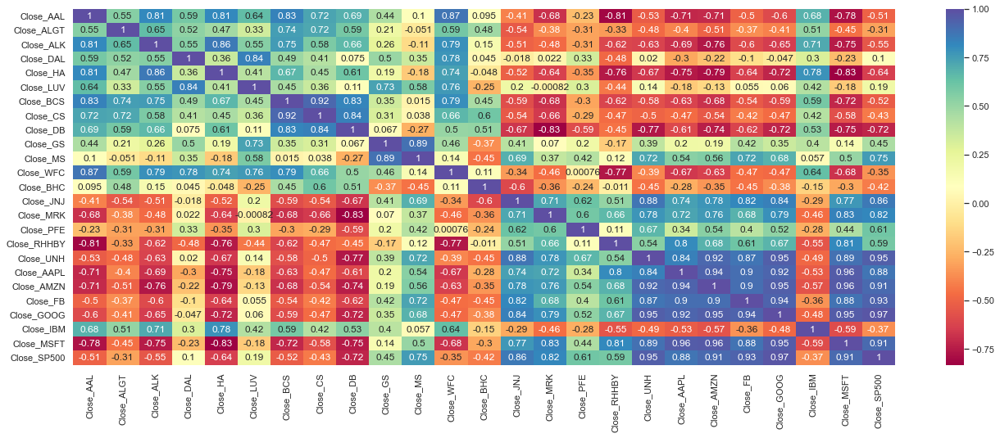

In [52]:
#Plotting the correlation of Stock Prices
plt.figure(figsize = (20,8))
sns.heatmap(AllStocks_Price.corr(),annot = True,cmap=palette)
plt.show()

#### Observation:
- Strong Positive Correlation (0.6 to 1): Apple, Amazon, Google, Goldman Sachs, J&J, Merck & Co
- Weak Positive Correlation (0 to 0.6): American Airlines, Alaska Air, Hawaiian Holdings.
- Negative Correlation (0 to -1): Bausch Health, Credit Suisse, Deutsche Bank.
- Ideally, the stocks that have negative correlation with the Index (S&P 500) should be avoided in the portfolio since they may prove to be very risky.

In [53]:
# with the help of Plotly functions we will plot the graphs

# Note: Here we are ignoring the column S&P500 as it is the market index

# lets define the function to plot the graph
def visualize(AllStocks_Price, addAll = True):
    fig = go.Figure()

    for column in AllStocks_Price.columns.to_list()[:-1]:
        fig.add_trace(
            go.Scatter(
                x = AllStocks_Price.index,
                y = AllStocks_Price[column],
                name = column
            )
        )
# defining a "All" button to showcase all the stocks at a time
    button_all = dict(label = 'All',
                      method = 'update',
                      args = [{'visible': AllStocks_Price.columns[:-1].isin(AllStocks_Price.columns.to_list()[:-1]),
                               'title': 'All',
                               'showlegend':True}])
    
# defining the stocks button to showcase the individual stocks at a time
    def stocks_layout_button(column):
        return dict(label = column,
                    method = 'update',
                    args = [{'visible': AllStocks_Price.columns[:-1].isin([column]),
                             'title': column,
                             'showlegend': True}])
    
# after the selection of stock/slider has moved the graph has to be updated
    fig.update_layout(
        updatemenus=[go.layout.Updatemenu(
            active = 0,
            buttons = ([button_all] * addAll) + list(AllStocks_Price.columns[:-1].map(lambda column: stocks_layout_button(column)))
            
        )
        ])
    
# defining a slider option to increase or decrease the time period    
    fig.update_layout(title_text="Visualizing Actual Stock Values",
                  xaxis_rangeslider_visible=True)
    fig.show()

# lets check the visualization of the stocks without normalization
visualize(AllStocks_Price)

#### Observation:
- We should consider stocks that have a positive movement suggesting that the price has increased during the given period
- Also, it suggests that the prices are expected to show an uptrend in the future.
- The price of aviation and banking stocks has gone down. The highest drop in the prices can be observed in DB and BHC.

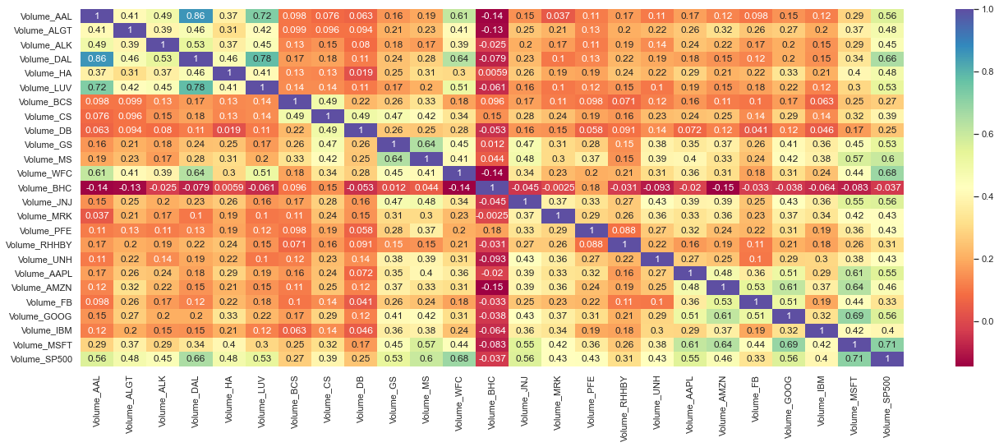

In [54]:
#Plotting the correlation of Stock Volume
plt.figure(figsize = (20,8))
sns.heatmap(AllStocks_Vol.corr(),annot = True,cmap=palette)
plt.show()

#### Observation:
- S&P500 has a positve correlation with all the stock except with BHC
- Correlation of more than 0.6 can be observed in the volumes of DAL, WFC & MS, and the highest is with MSFT(0.71).
- At the end of 5 years we can see that the 8 stocks having returns of greater than 80%

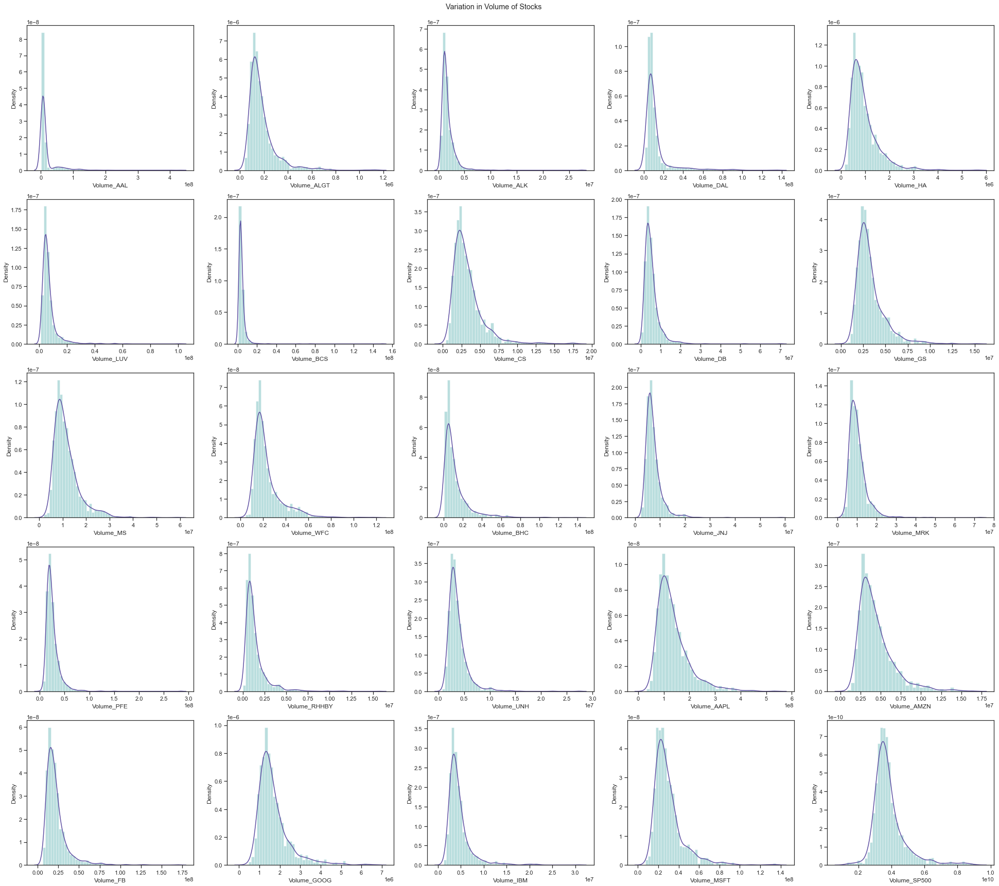

In [55]:
#Plotting the histogram plots of the Volumes of Stocks
plt.figure(figsize = (30,30))
sns.set_style("ticks")
plt.tight_layout()
feature = AllStocks_Vol.columns
for i in enumerate(feature):
    plt.subplot(5,5, i[0]+1)
    sns.distplot(AllStocks_Vol[i[1]],hist=True,hist_kws={"color":blue},kde_kws={"color":indi})
    
plt.suptitle("Variation in Volume of Stocks",y=0.9)
plt.show()

#### Observation:
- Higher the standard deviation, more volatile is the stock. So, in the above figures a volatile stock will cover more area.
- ALGT, DAL, HA, CS, GS, MS, WFC, BHC, RHBY, AAPL, GOOG, IBM --> Volatility can be seen in these stocks.

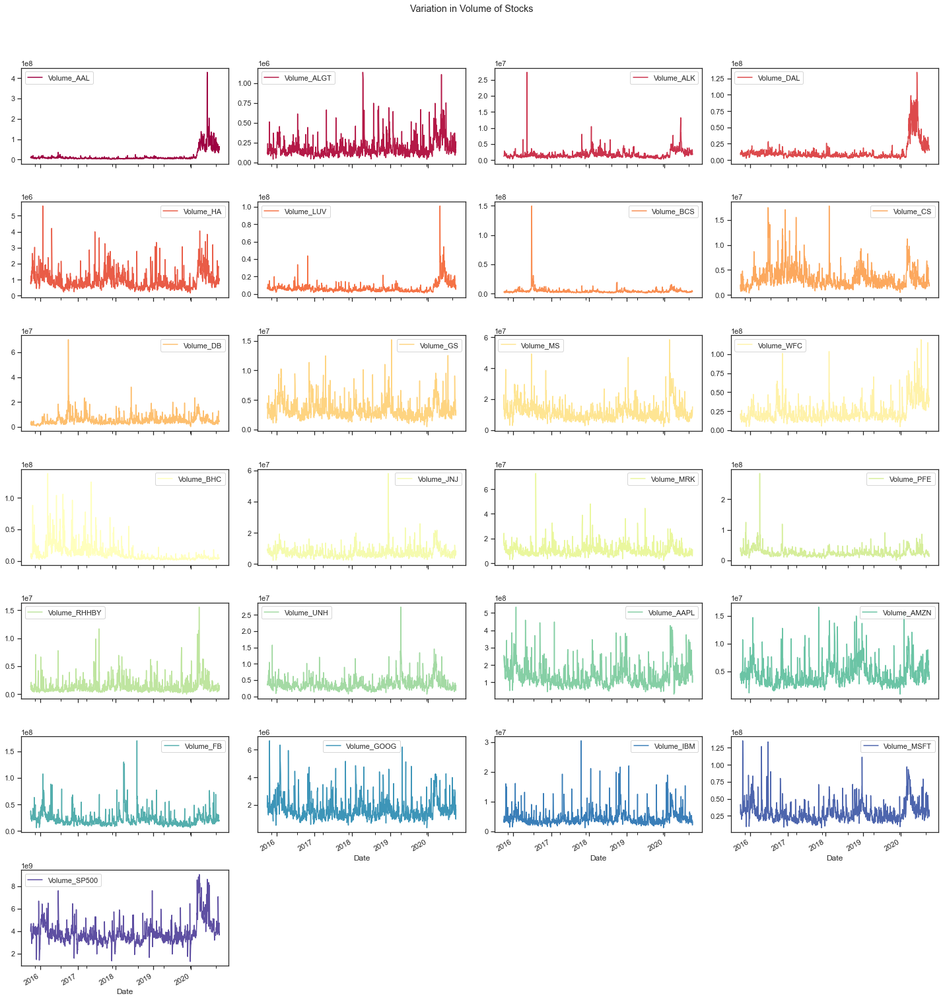

In [56]:
#Creating Sub-plots to visualize the stocks volume
AllStocks_Vol.plot(kind = 'line',subplots=True, layout = (7,4),figsize=(20,20),cmap=palette)
sns.set_style("ticks")
plt.tight_layout()
plt.suptitle("Variation in Volume of Stocks",y=1.05)
plt.show()

#### Observation:
- AAPL, DAL, LUV ---> the volumes have gone up in 2019-20
- Trading volumes have gone down in ALK, BCS, DB, BHC, JNJ and PFE.
- The volume movement in most technology stocks is observed in sync with S&P 500.

In [57]:
# with the help of Plotly functions we will plot the graphs

# Note: Here we are adding the first column S&P500 to check the stocks against the market index

# lets define the function to plot the graph
def visualize1(data, addAll = True):
    fig = go.Figure()

    for column in data.columns.to_list()[:]:
        fig.add_trace(
            go.Scatter(
                x = data.index,
                y = data[column],
                name = column
            )
        )
# defining a "All" button to showcase all the stocks at a time
    button_all = dict(label = 'All',
                      method = 'update',
                      args = [{'visible': data.columns[:].isin(data.columns.to_list()[:]),
                               'title': 'All',
                               'showlegend':True}])
    
# defining the stocks button to showcase the individual stocks at a time
    def stocks_layout_button(column):
        return dict(label = column,
                    method = 'update',
                    args = [{'visible': data.columns.isin([column]),
                             'title': column,
                             'showlegend': True}])
    
# after the selection of stock/slider has moved the graph has to be updated
    fig.update_layout(
        updatemenus=[go.layout.Updatemenu(
            active = 0,
            buttons = ([button_all] * addAll) + list(data.columns[:].map(lambda column: stocks_layout_button(column)))
            
        )
        ])
    
# defining a slider option to increase or decrease the time period    
    fig.update_layout(title_text="Visualizing Normalized Stock Values",
                  xaxis_rangeslider_visible=True)
    fig.show()
    
# lets visualize the normalized stocks
visualize1(normalized_data)

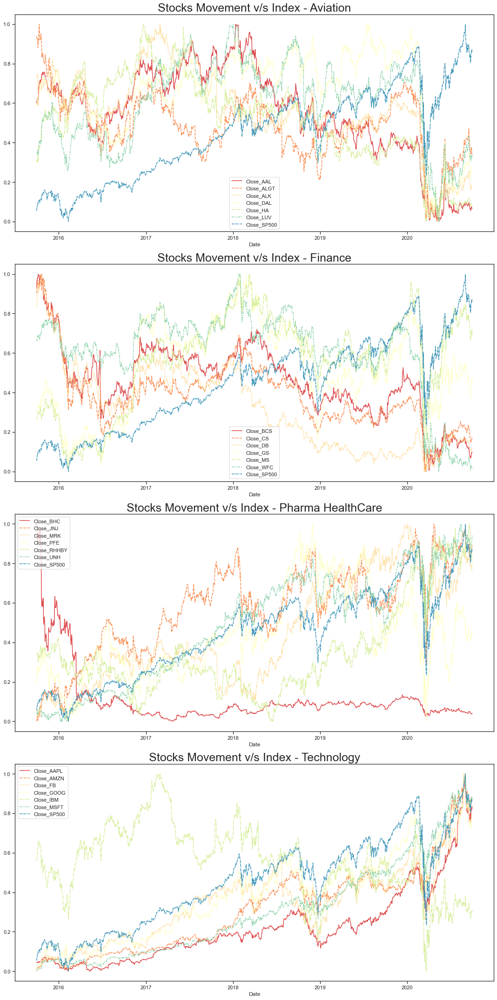

In [58]:
# Plotting Normalized Stock Prices against Index
plt.figure(figsize=(15,30))
sns.set_style("ticks")

plt.subplot(4,1,1)
sns.lineplot(data = normalized_data[['Close_AAL','Close_ALGT','Close_ALK','Close_DAL','Close_HA','Close_LUV','Close_SP500']],palette=palette)
plt.legend(loc='best')
plt.tight_layout()
plt.title('Stocks Movement v/s Index - Aviation',fontsize=25) 

plt.subplot(4,1,2)
sns.lineplot(data = normalized_data[['Close_BCS','Close_CS','Close_DB','Close_GS','Close_MS','Close_WFC','Close_SP500']],palette=palette)
plt.legend(loc='best')
plt.tight_layout()
plt.title('Stocks Movement v/s Index - Finance',fontsize=25) 

plt.subplot(4,1,3)
sns.lineplot(data = normalized_data[['Close_BHC','Close_JNJ','Close_MRK','Close_PFE','Close_RHHBY','Close_UNH','Close_SP500']],palette=palette)
plt.legend(loc='best')
plt.tight_layout()
plt.title('Stocks Movement v/s Index - Pharma HealthCare',fontsize=25) 

plt.subplot(4,1,4)
sns.lineplot(data = normalized_data[['Close_AAPL','Close_AMZN','Close_FB','Close_GOOG','Close_IBM','Close_MSFT','Close_SP500']],palette=palette)
plt.legend(loc='best')
plt.tight_layout()
plt.title('Stocks Movement v/s Index - Technology',fontsize=25) 

plt.show()

## Daily Returns
A return, also known as a financial return, in its simplest terms, is the money made or lost on an investment over some period of time.

A return is a percentage defined as the change of price expressed as a fraction of the initial price.

Returns exhibit more attractive statistical properties than asset prices themselves. Therefore it also makes more statistical sense to analyze return data rather than price series.

We will use formula and pandas built in function pct_change to compute the simple returns for each day, each stock in our dataset.

In [59]:
AllStocks_Price_returns = AllStocks_Price.pct_change()

AllStocks_Price_returns = round((AllStocks_Price_returns[1:]*100),2)
AllStocks_Price_returns.head()

,Close_AAL,Close_ALGT,Close_ALK,Close_DAL,Close_HA,Close_LUV,Close_BCS,Close_CS,Close_DB,Close_GS,Close_MS,Close_WFC,Close_BHC,Close_JNJ,Close_MRK,Close_PFE,Close_RHHBY,Close_UNH,Close_AAPL,Close_AMZN,Close_FB,Close_GOOG,Close_IBM,Close_MSFT,Close_SP500
Date,,,,,,,,,,,,,,,,,,,,,,,,,
2015-10-02,-1.45,-1.10,-1.21,-1.19,-1.82,-0.08,2.53,2.28,2.34,0.56,-0.22,-0.35,1.51,0.82,1.56,3.89,0.30,1.90,0.73,2.27,1.23,2.56,0.69,2.15,1.43
2015-10-05,4.04,0.22,2.08,4.66,5.02,2.40,1.36,2.11,3.91,2.08,2.74,2.24,-10.34,0.88,2.17,1.21,0.36,0.69,0.36,2.09,2.11,2.32,3.08,2.33,1.83
2015-10-06,-5.13,-3.45,-7.89,-3.98,-4.90,-3.31,-0.32,0.87,0.71,-0.21,0.22,-0.73,1.55,-1.41,-2.79,-2.06,0.27,-3.01,0.48,-1.14,-1.29,0.62,-0.17,0.26,-0.36
2015-10-07,3.09,2.51,1.93,2.00,1.28,1.87,1.16,-0.24,1.37,1.06,1.76,0.31,2.31,1.67,2.31,1.52,-2.92,0.33,-0.48,0.83,-0.43,-0.48,0.88,0.11,0.80
2015-10-08,1.09,-0.55,-0.28,-0.07,6.23,0.13,0.51,-3.12,-1.39,-0.64,0.18,0.67,0.79,0.11,0.14,-0.60,2.15,-0.30,-1.16,-1.62,0.08,-0.50,1.46,1.39,0.88


In [60]:
visualize(AllStocks_Price_returns)

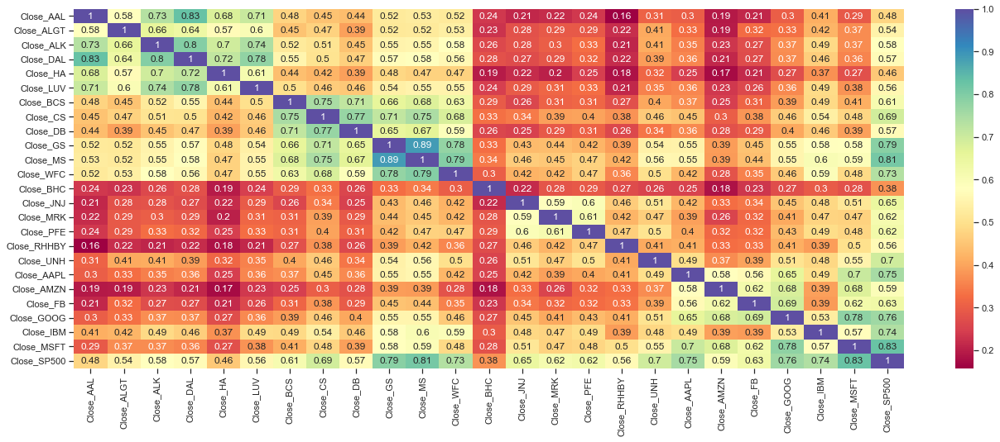

In [61]:
#Plotting the correlation of Daily Returns
plt.figure(figsize = (20,8))
sns.heatmap(AllStocks_Price_returns.corr(),annot = True,cmap=palette)
plt.show()

#### Observation:
From the above Graph we can see that

- Microsoft & Google stocks are highly correlated in the Techonolgy Stocks
- Goldman Sachs, Morgan Stanley & WellsFargo are correlated in the Finance Stocks
- American Airlines & Delta Airlines are more correlated than Alaska Air Group in the Aviation stocks
- Pharma stocks are less correlated when comapred to any other sector stocks

In [62]:
# Checking the statistical values for daily returns of stocks
AllStocks_Price_returns.describe()

,Close_AAL,Close_ALGT,Close_ALK,Close_DAL,Close_HA,Close_LUV,Close_BCS,Close_CS,Close_DB,Close_GS,Close_MS,Close_WFC,Close_BHC,Close_JNJ,Close_MRK,Close_PFE,Close_RHHBY,Close_UNH,Close_AAPL,Close_AMZN,Close_FB,Close_GOOG,Close_IBM,Close_MSFT,Close_SP500
count,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000
mean,-0.033808,-0.004714,-0.025548,0.004237,0.003529,0.024666,-0.054754,-0.043760,-0.052925,0.030286,0.057886,-0.041494,-0.089626,0.045032,0.051264,0.020572,0.029308,0.094062,0.132138,0.161033,0.105079,0.083498,-0.000207,0.138625,0.051733
std,3.472455,2.910028,2.690616,2.647849,3.313180,2.291209,2.511813,2.283985,2.774197,1.989936,2.181011,2.034980,4.454969,1.245863,1.406699,1.382649,1.351350,1.780985,1.872844,1.896930,2.035461,1.652143,1.608626,1.753969,1.207997
min,-25.220000,-28.330000,-23.240000,-25.990000,-26.500000,-15.110000,-21.850000,-18.260000,-17.490000,-12.710000,-15.600000,-15.870000,-51.460000,-10.040000,-8.900000,-7.730000,-8.960000,-17.280000,-12.860000,-7.920000,-18.960000,-11.100000,-12.850000,-14.740000,-11.980000
25%,-1.360000,-1.130000,-1.070000,-0.970000,-1.490000,-0.920000,-1.080000,-1.040000,-1.497500,-0.837500,-0.900000,-0.790000,-1.967500,-0.430000,-0.620000,-0.590000,-0.627500,-0.660000,-0.620000,-0.670000,-0.720000,-0.577500,-0.650000,-0.590000,-0.290000
50%,-0.050000,-0.040000,0.025000,0.080000,0.030000,0.060000,0.000000,0.000000,-0.105000,0.030000,0.045000,-0.040000,-0.050000,0.050000,0.020000,0.010000,0.020000,0.080000,0.100000,0.160000,0.120000,0.100000,0.050000,0.120000,0.070000
75%,1.320000,1.165000,1.060000,0.977500,1.510000,1.000000,1.020000,1.040000,1.390000,0.970000,1.047500,0.757500,1.800000,0.590000,0.760000,0.637500,0.690000,0.817500,0.990000,1.077500,1.090000,0.880000,0.687500,0.920000,0.520000
max,41.100000,29.240000,20.310000,21.020000,24.580000,14.440000,15.100000,16.340000,14.020000,17.580000,19.770000,14.530000,33.740000,8.000000,10.410000,8.960000,13.010000,12.800000,11.980000,13.220000,15.520000,10.450000,11.300000,14.220000,9.380000


## Relative Stock Price  - Change in Stock Price wrt Index

In [63]:
AllStockvsIndex = AllStocks_Price.copy()
for column in AllStockvsIndex.columns:
    AllStockvsIndex[column] = AllStockvsIndex[column]/AllStockvsIndex['Close_SP500']
AllStockvsIndex.head()

,Close_AAL,Close_ALGT,Close_ALK,Close_DAL,Close_HA,Close_LUV,Close_BCS,Close_CS,Close_DB,Close_GS,Close_MS,Close_WFC,Close_BHC,Close_JNJ,Close_MRK,Close_PFE,Close_RHHBY,Close_UNH,Close_AAPL,Close_AMZN,Close_FB,Close_GOOG,Close_IBM,Close_MSFT,Close_SP500
Date,,,,,,,,,,,,,,,,,,,,,,,,,
2015-10-01,0.020376,0.113306,0.041703,0.023604,0.012855,0.019965,0.007802,0.012522,0.013785,0.091495,0.016374,0.026738,0.093356,0.048430,0.025662,0.016550,0.017268,0.060614,0.014240,0.270670,0.047276,0.317748,0.074638,0.023188,1.0
2015-10-02,0.019796,0.110482,0.040618,0.022994,0.012443,0.019668,0.007887,0.012627,0.013908,0.090711,0.016107,0.026269,0.093432,0.048136,0.025695,0.016952,0.017075,0.060896,0.014141,0.272907,0.047182,0.321268,0.074092,0.023353,1.0
2015-10-05,0.020226,0.108734,0.040719,0.023633,0.012833,0.019778,0.007851,0.012662,0.014192,0.090939,0.016250,0.026376,0.082263,0.047689,0.025782,0.016849,0.016829,0.060215,0.013938,0.273612,0.047311,0.322825,0.075006,0.023467,1.0
2015-10-06,0.019258,0.105358,0.037643,0.022774,0.012248,0.019193,0.007854,0.012819,0.014344,0.091074,0.016344,0.026279,0.083842,0.047184,0.025153,0.016561,0.016935,0.058613,0.014055,0.271465,0.046871,0.325993,0.075144,0.023612,1.0
2015-10-07,0.019696,0.107143,0.038064,0.023043,0.012306,0.019395,0.007881,0.012686,0.014425,0.091305,0.016499,0.026150,0.085092,0.047589,0.025528,0.016680,0.016309,0.058337,0.013876,0.271536,0.046297,0.321851,0.075202,0.023449,1.0


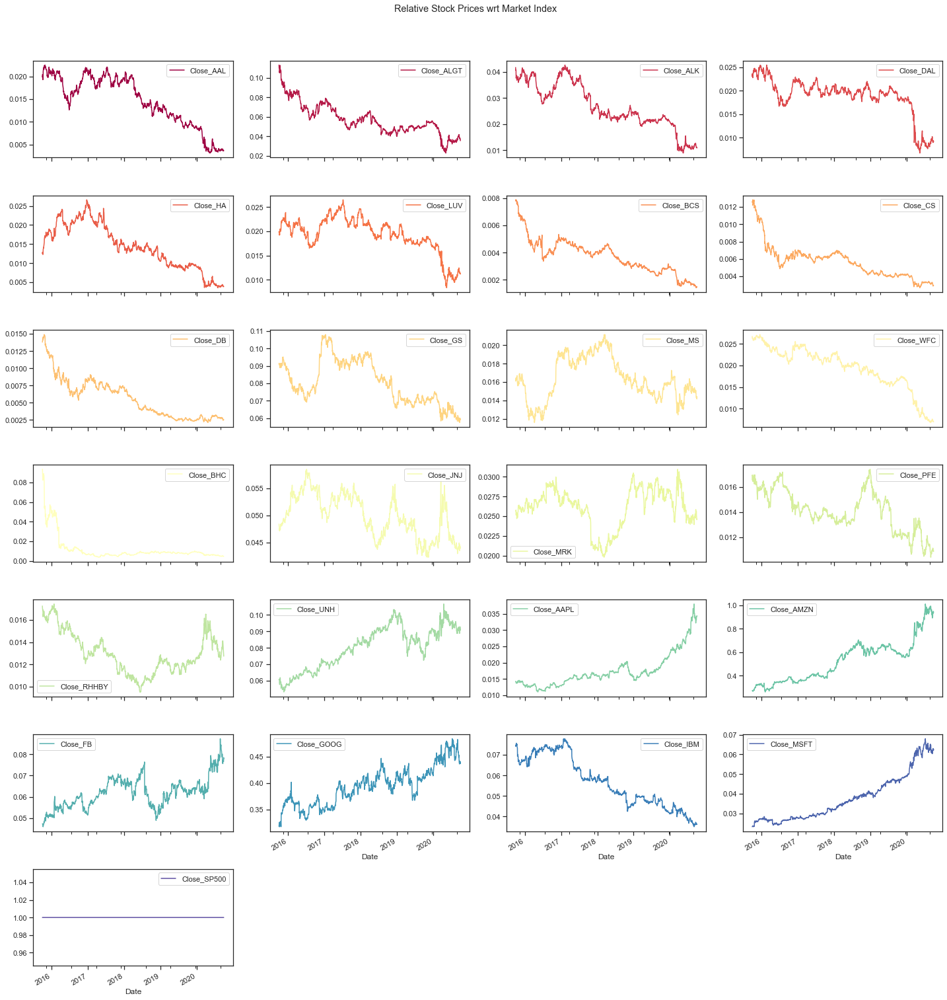

In [64]:
# Plotting the Relative Stock Price change 
AllStockvsIndex.plot(kind = 'line',subplots=True, layout = (7,4),figsize=(20,20),cmap=palette)
plt.tight_layout()
plt.suptitle('Relative Stock Prices wrt Market Index',y=1.05)
plt.show()

## Annualized Risk, Annualized Returns, Cumulative Returns and Sharpe Ratio

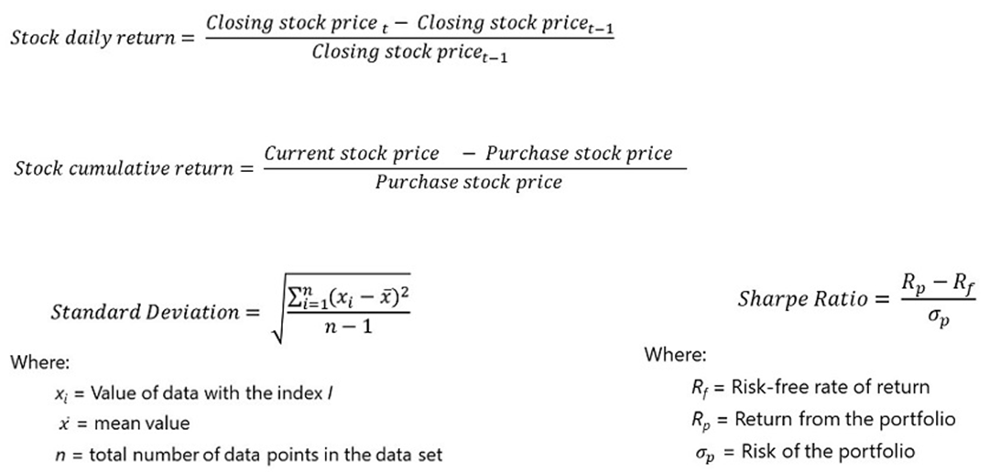

In [65]:
#Calculating Annualized_Returns

Annualized_Returns = []
col=[]

for i in AllStocks_Price_returns.columns:
    col.append(i)

for i in AllStocks_Price_returns.columns:
    Annualized_Returns.append(AllStocks_Price_returns[i].mean()*252)

In [66]:
# Creating a dataframe and stocks values for each stock
Annualized=pd.DataFrame(list(zip(col,Annualized_Returns)),columns =['Stocks', 'AnnualizedReturns'])

In [67]:
# Renaming the names of stocks
for i in Annualized.index:
    Annualized['Stocks'][i]=Annualized['Stocks'][i].replace("Close_","")
Annualized

,Stocks,AnnualizedReturns
0,AAL,-8.519523
1,ALGT,-1.187886
2,ALK,-6.438219
3,DAL,1.067695
4,HA,0.889412
5,LUV,6.215866
6,BCS,-13.797901
7,CS,-11.027504
8,DB,-13.337170
9,GS,7.632114


In [68]:
Annualized['AnnualizedReturns']=Annualized['AnnualizedReturns'].round(3)

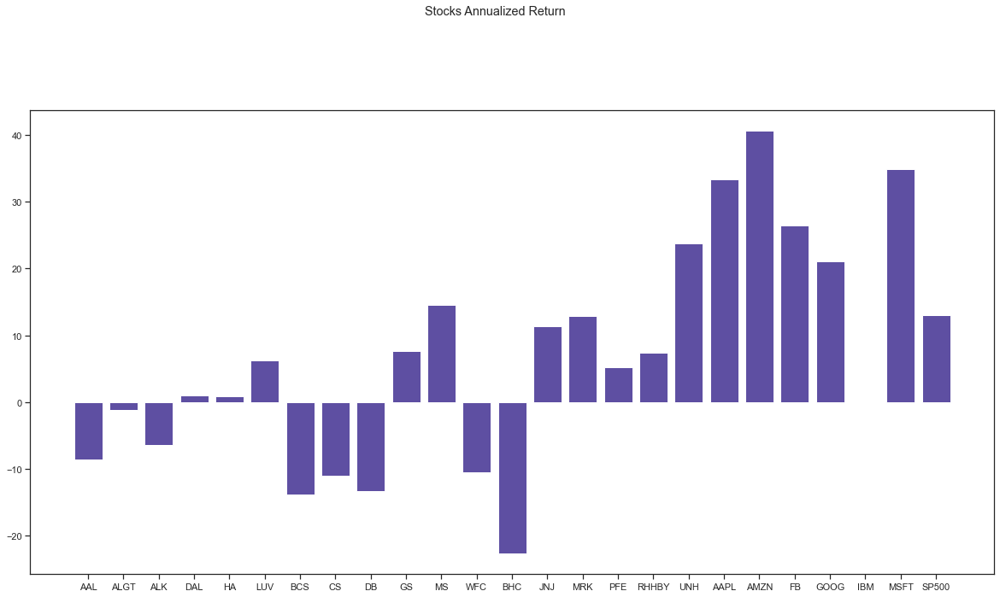

In [69]:
plt.figure(figsize = (18,10))
sns.set_style("ticks")
plt.bar(Annualized['Stocks'],Annualized['AnnualizedReturns'],color=indi)
plt.suptitle('Stocks Annualized Return',y=1.05)
plt.show()

#### Observation:
- All tech stocks have given positive returns except IBM. The highest returns have been given by AMZN followed by MSFT followed by AAPL.
- Highest negative return was in health care - BHC to the tune of -22%.
- In healthcare, UNH has given highest positive return - 23%.
- In Finance, barring GS and MS, all stocks have given negative returns.
- The lowest positive  returns have been observed in Aviation industry - HA at 0.88%, followed by DAL at 1.06%

In [70]:
#Calculating Annualized_Risk
Annualized_Risk = []

for i in AllStocks_Price_returns.columns:
    Annualized_Risk.append(AllStocks_Price_returns[i].std()*np.sqrt(252))

In [71]:
# Adding Annualized Risk column to the dataframe
Annualized['AnnualizedRisk']= Annualized_Risk
Annualized

,Stocks,AnnualizedReturns,AnnualizedRisk
0,AAL,-8.520,55.123508
1,ALGT,-1.188,46.195261
2,ALK,-6.438,42.712205
3,DAL,1.068,42.033298
4,HA,0.889,52.595107
5,LUV,6.216,36.371822
6,BCS,-13.798,39.873802
7,CS,-11.028,36.257140
8,DB,-13.337,44.039005
9,GS,7.632,31.589258


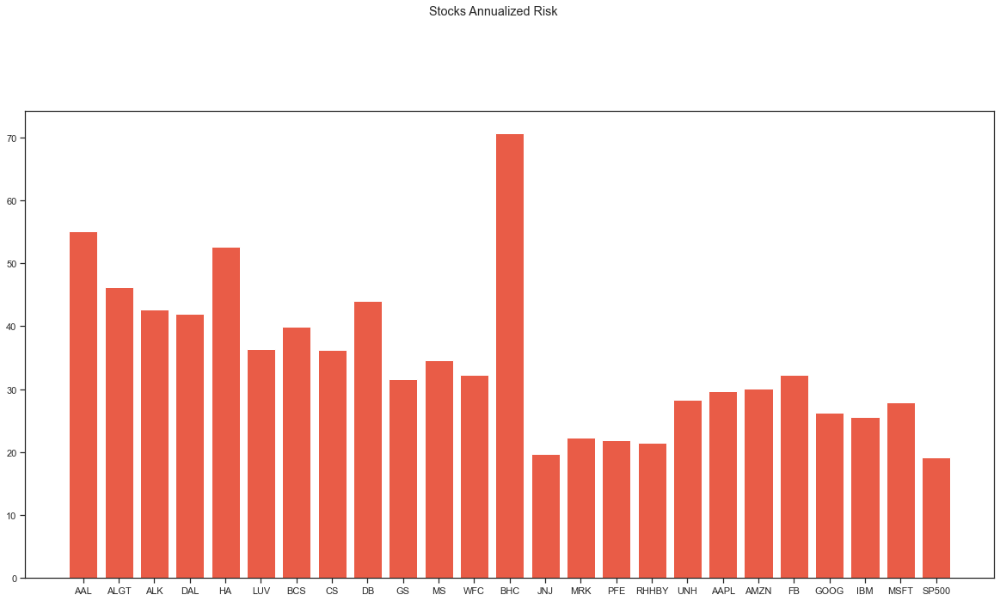

In [72]:
plt.figure(figsize = (18,10))
sns.set_style("ticks")
plt.bar(Annualized['Stocks'],Annualized['AnnualizedRisk'],color=red)
plt.suptitle('Stocks Annualized Risk',y=1.05)
plt.show()

#### Observation: 
- BHC has the highest risk factor whereas, JNJ having the least risk factor.
- All the stocks of technology sector, have low risk.
- Stocks of Financial sector are more risky

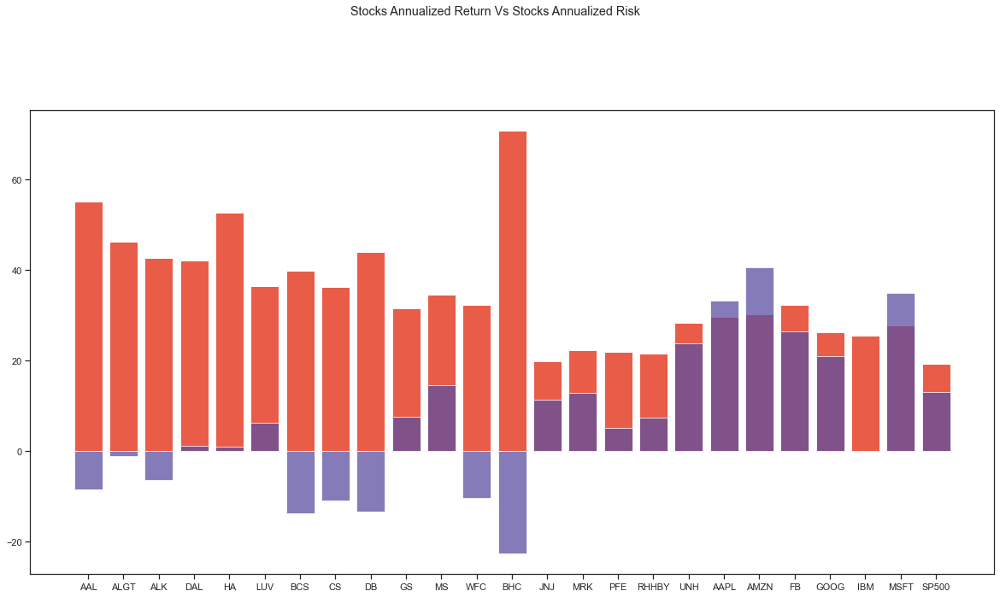

In [73]:
plt.figure(figsize = (18,10))
sns.set_style("ticks")
plt.bar(Annualized['Stocks'],Annualized['AnnualizedRisk'],color=red)
plt.bar(Annualized['Stocks'],Annualized['AnnualizedReturns'],color=indi,alpha=0.75)
plt.suptitle('Stocks Annualized Return Vs Stocks Annualized Risk',y=1.05)
plt.show()

#### Observation: 
- In aviation industry, the risk is high, whereas the returns are low or negative
- In BHC, the annualised risk is highest, giving us highest negative returns - 22%.
- Technology stocks have compparatively lower risk and higher returns
- We should consider risk factor while making a portfolio, since though there could be an uptrend, there could be higher risk involved too.

In [74]:
#Calculating Cummulative_returns
Cumulative_ret =[]
for i in AllStocks_Price_returns.columns:
    Cumulative_ret.append(AllStocks_Price[i][-1]/AllStocks_Price[i][0]-1)

In [75]:
# Adding Cumulative_ret column to the dataframe
Annualized['Cumulative_ret']= Cumulative_ret
Annualized['Cumulative_ret']=round(Annualized['Cumulative_ret'],4)*100

In [76]:
#Calculating Sharpe Ratio with 0.75% rfr
Annualized['Sharpe_Ratio'] = (Annualized['AnnualizedReturns']-0.0075)/Annualized['AnnualizedRisk']

In [77]:
Annualized

,Stocks,AnnualizedReturns,AnnualizedRisk,Cumulative_ret,Sharpe_Ratio
0,AAL,-8.520,55.123508,-68.65,-0.154698
1,ALGT,-1.188,46.195261,-45.04,-0.025879
2,ALK,-6.438,42.712205,-54.34,-0.150905
3,DAL,1.068,42.033298,-32.66,0.025230
4,HA,0.889,52.595107,-47.88,0.016760
5,LUV,6.216,36.371822,-2.37,0.170695
6,BCS,-13.798,39.873802,-66.62,-0.346230
7,CS,-11.028,36.257140,-58.61,-0.304368
8,DB,-13.337,44.039005,-68.33,-0.303015
9,GS,7.632,31.589258,14.17,0.241364


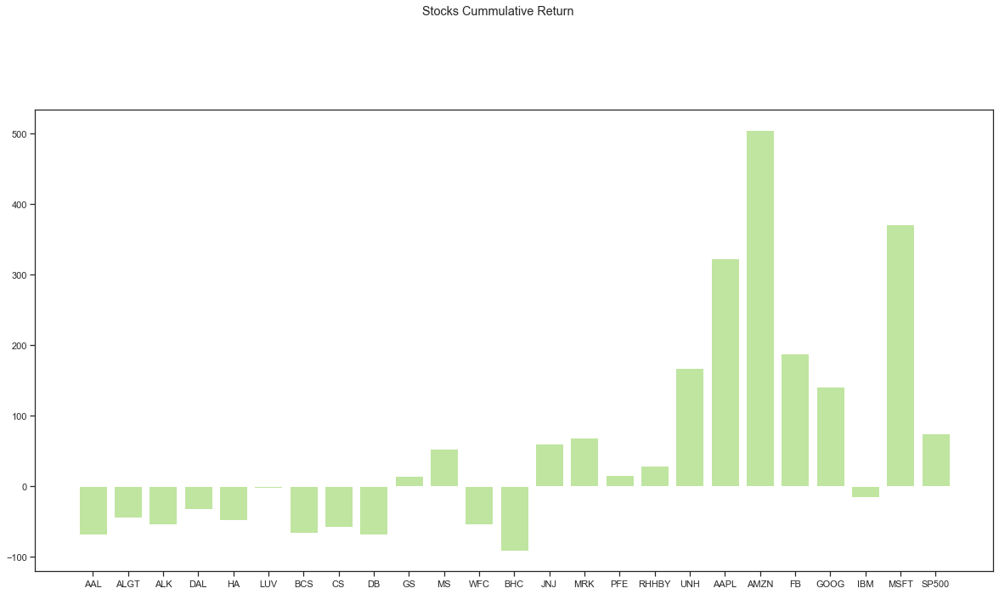

In [78]:
plt.figure(figsize = (18,10))
sns.set_style("ticks")
plt.bar(Annualized['Stocks'],Annualized['Cumulative_ret'],color=gre)
plt.suptitle('Stocks Cummulative Return',y=1.05)
plt.show()

#### Observation: 
- Highest cumulative returns have been provided by technology stocks except IBM.
- To be in sync with the investment goals of the investors, we will not include any stocks giving negative returns in the portfolio.

In [79]:
# Getting rid of the Stocks having negetive Annualized returns
newAnnualized=Annualized.loc[(Annualized.AnnualizedReturns > 0.0)]
newAnnualized

,Stocks,AnnualizedReturns,AnnualizedRisk,Cumulative_ret,Sharpe_Ratio
3,DAL,1.068,42.033298,-32.66,0.025230
4,HA,0.889,52.595107,-47.88,0.016760
5,LUV,6.216,36.371822,-2.37,0.170695
9,GS,7.632,31.589258,14.17,0.241364
10,MS,14.587,34.622473,53.49,0.421099
13,JNJ,11.348,19.777468,59.79,0.573405
14,MRK,12.919,22.330662,68.02,0.578196
15,PFE,5.184,21.948868,15.26,0.235844
16,RHHBY,7.386,21.452019,28.87,0.343954
17,UNH,23.704,28.272255,167.36,0.838154


In [80]:
newAnnualized.sort_values(by=['Sharpe_Ratio'],ascending=[False])

,Stocks,AnnualizedReturns,AnnualizedRisk,Cumulative_ret,Sharpe_Ratio
19,AMZN,40.580,30.112837,504.69,1.347349
23,MSFT,34.933,27.843398,371.49,1.254355
18,AAPL,33.299,29.730469,322.74,1.119777
17,UNH,23.704,28.272255,167.36,0.838154
20,FB,26.480,32.311941,187.96,0.819279
21,GOOG,21.041,26.226954,140.41,0.801980
24,SP500,13.037,19.176361,74.81,0.679456
14,MRK,12.919,22.330662,68.02,0.578196
13,JNJ,11.348,19.777468,59.79,0.573405
10,MS,14.587,34.622473,53.49,0.421099


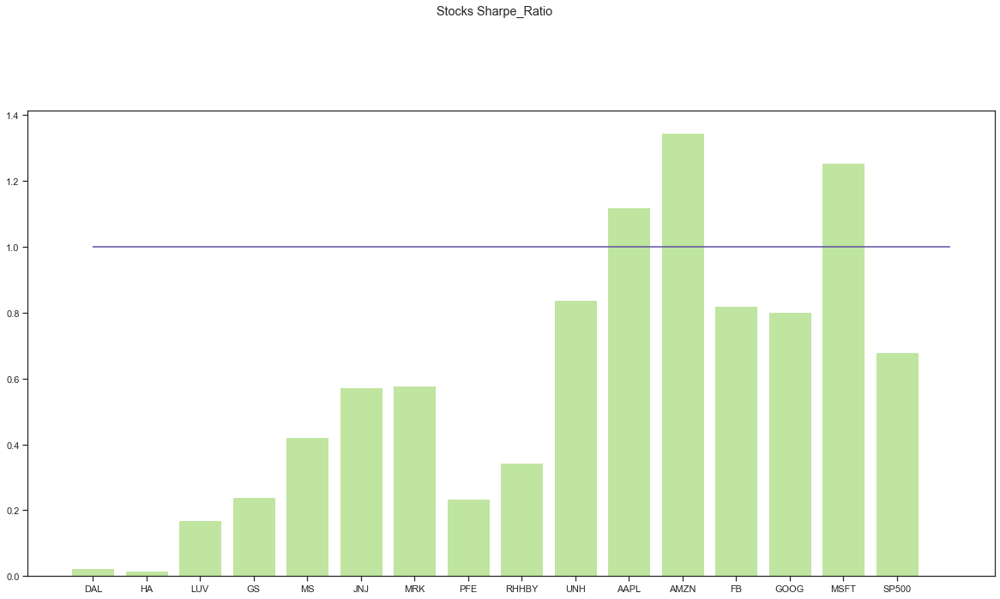

In [81]:
plt.figure(figsize = (18,10))
sns.set_style("ticks")
plt.bar(newAnnualized['Stocks'],newAnnualized['Sharpe_Ratio'],color=gre)
plt.hlines(1,0,16,color= indi)
plt.suptitle('Stocks Sharpe_Ratio',y=1.05)
plt.show()

#### Observation: 
The ideal sharpe ratio is 1 and above. Stocks with negative sharpe ratio should not be included in the portfolio.

At the end of 5 years we can see that the top 8 stocks having returns of greater than 80% are as follows

- AMZN gives 40.59% annual returns
- MSFT gives 34.95% annual returns
- AAPL gives 33.32% annual returns
- FB gives 26.45% annual returns
- UNH gives 23.72% annual returns
- GOOG gives 21.02% annual returns
- MS gives 14.55% annual returns
- S&P500 gives 13.04% annual returns

## ACT

In the final step, we will be delivering our insights and providing recommendations based on our analysis. 

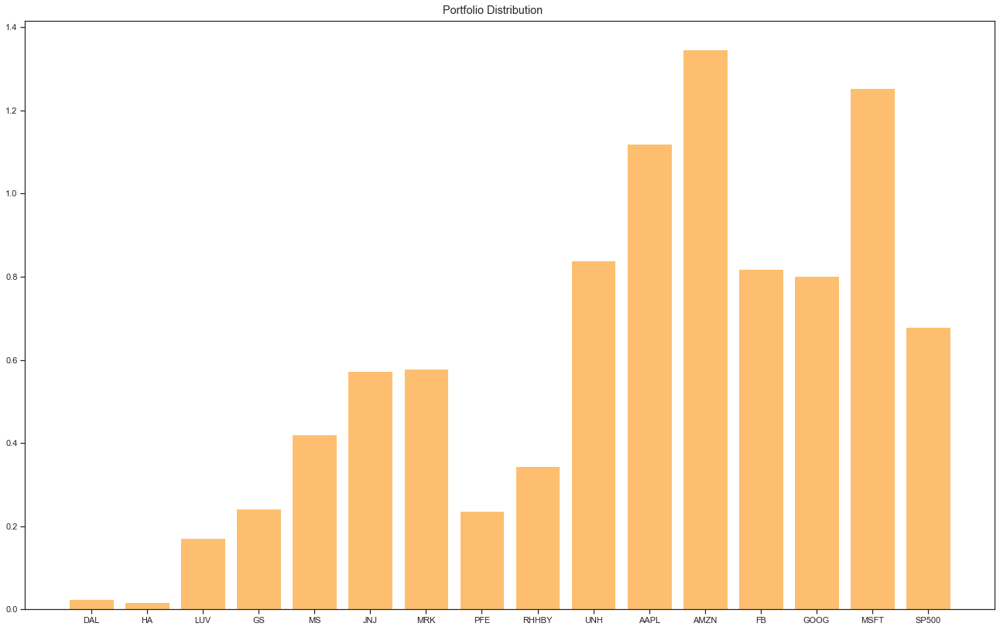

In [82]:
plt.figure(figsize = (20,14))
sns.set_style("ticks")
plt.bar(newAnnualized['Stocks'],newAnnualized['Sharpe_Ratio'],color=ora)
plt.suptitle('Portfolio Distribution',y=0.9)
plt.show()

## Mr. Patrick Jyengar Portfolio Building
Mr. Patrick Jyengar wants to double his investment in the span on 5 years. He wants to invest in low-risk stocks which would fetch him decent returns.

As per his profile Low risk stocks like JNJ, RHHBY and MRK are suitable to invest in. But overall returns with these three stocks wouldn't reach the target that Mr.Patrick is investing for. So one portion of his wealth can be invested in MSFT to gain the desired returns.

Lets calculate the Risk and Returns associated with the above mentioned portfolio.

In [83]:
# Initial weight for each stock in order
stocks = ['Close_MSFT', 'Close_JNJ', 'Close_RHHBY' ,'Close_MRK']
initial_weight = np.array([0.25, 0.25, 0.25, 0.25])

# Lets create a dataset for selected stocks
portfolio = AllStocks_Price.copy()
portfolio = portfolio[stocks]
portfolio.tail()

,Close_MSFT,Close_JNJ,Close_RHHBY,Close_MRK
Date,,,,
2020-09-24,203.190002,144.669998,44.700001,83.150002
2020-09-25,207.820007,145.660004,44.820000,82.930000
2020-09-28,209.440002,147.110001,44.110001,82.760002
2020-09-29,207.259995,147.059998,43.369999,81.900002
2020-09-30,210.330002,148.880005,42.810001,82.949997


In [84]:
# Daily return from each stock 
stocks_returns = portfolio.pct_change()
stocks_returns.head(8)

,Close_MSFT,Close_JNJ,Close_RHHBY,Close_MRK
Date,,,,
2015-10-01,NaN,NaN,NaN,NaN
2015-10-02,0.021520,0.008157,0.003010,0.015597
2015-10-05,0.023261,0.008836,0.003601,0.021739
2015-10-06,0.002573,-0.014141,0.002691,-0.027913
2015-10-07,0.001069,0.016699,-0.029228,0.023092
2015-10-08,0.013889,0.001053,0.021505,0.001374
2015-10-09,-0.007165,0.003050,-0.011729,-0.001372
2015-10-12,-0.002335,0.006501,0.004260,-0.004711


In [85]:
# Average daily return from each stock
mean_stocks_daily_returns = stocks_returns.mean()
print(mean_stocks_daily_returns)

Close_MSFT     0.001387
Close_JNJ      0.000451
Close_RHHBY    0.000293
Close_MRK      0.000511
dtype: float64


In [86]:
# Risk of Stocks in Portfolio
stock_risk = stocks_returns.std()
stock_risk

Close_MSFT     0.017539
Close_JNJ      0.012459
Close_RHHBY    0.013514
Close_MRK      0.014067
dtype: float64

In [87]:
# Portfolio daily returns
# The weighted average can be calculated to determine the return from the portfolio on a daily basis.
stocks_returns['portfolio_daily_returns'] = stocks_returns.dot(initial_weight)
stocks_returns

,Close_MSFT,Close_JNJ,Close_RHHBY,Close_MRK,portfolio_daily_returns
Date,,,,,
2015-10-01,NaN,NaN,NaN,NaN,NaN
2015-10-02,0.021520,0.008157,0.003010,0.015597,0.012071
2015-10-05,0.023261,0.008836,0.003601,0.021739,0.014359
2015-10-06,0.002573,-0.014141,0.002691,-0.027913,-0.009197
2015-10-07,0.001069,0.016699,-0.029228,0.023092,0.002908
...,...,...,...,...,...
2020-09-24,0.012962,0.001592,-0.003567,0.006293,0.004320
2020-09-25,0.022787,0.006843,0.002685,-0.002646,0.007417
2020-09-28,0.007795,0.009955,-0.015841,-0.002050,-0.000035


In [88]:
# We are calculating the total portfolio return

allocated_stocks_daily_returns = (initial_weight * mean_stocks_daily_returns)

portfolio_return = np.sum(allocated_stocks_daily_returns)
portfolio_return*100

0.06603738600705664

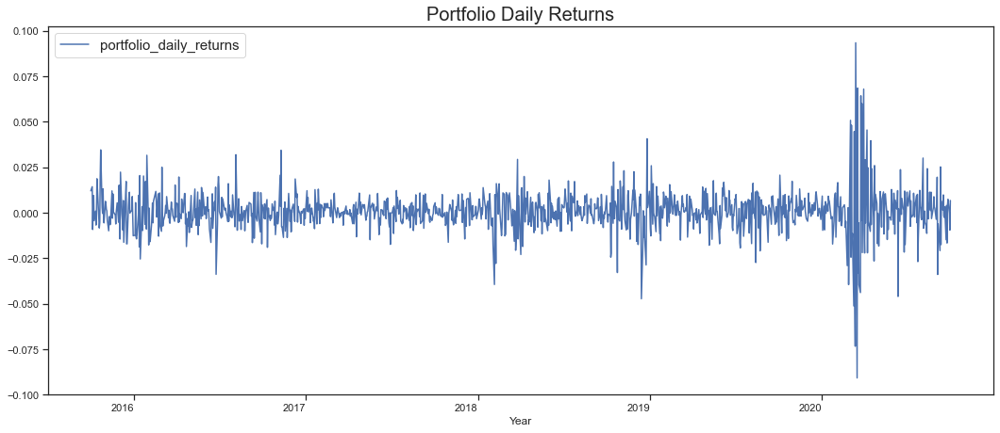

In [89]:
# Lets Plot the graph
plt.figure(figsize=(16,8))
stocks_returns['portfolio_daily_returns'].plot()
plt.title('Portfolio Daily Returns', fontsize = 20)
plt.legend(loc = 'best', fontsize = 15)
plt.xticks(rotation=0)
plt.xlabel("Year")
plt.show()

In [90]:
# Cumulative return from the portfolio

daily_cumulative_returns = (1+stocks_returns).cumprod()
daily_cumulative_returns.tail(5)

,Close_MSFT,Close_JNJ,Close_RHHBY,Close_MRK,portfolio_daily_returns
Date,,,,,
2020-09-24,4.554808,1.552753,1.345575,1.684221,2.106791
2020-09-25,4.658597,1.563379,1.349187,1.679765,2.122417
2020-09-28,4.694911,1.578942,1.327815,1.676322,2.122342
2020-09-29,4.646043,1.578405,1.305539,1.658902,2.102224
2020-09-30,4.714862,1.597939,1.288682,1.680170,2.116465


#### Obervations:
This suggests that the portfolio has achieved a cumulative return of 1.11% in the given period

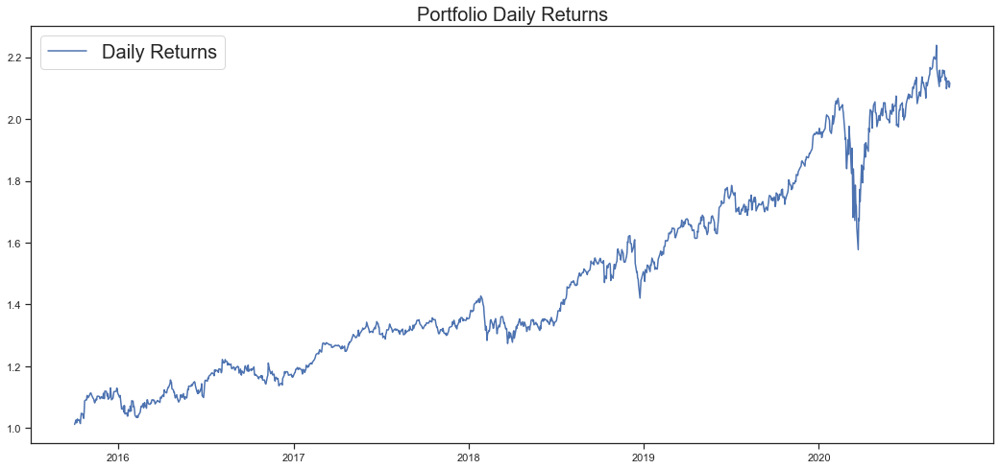

In [91]:
# Lets Plot the graph

plt.figure(figsize=(16,8))
plt.plot(daily_cumulative_returns['portfolio_daily_returns'], label = 'Daily Returns')
plt.title('Portfolio Daily Returns', fontsize = 20)
plt.legend(loc = 'best', fontsize = 20)
plt.show()

In [92]:
daily_cumulative_returns.to_csv("patrickcr.csv")

In [93]:
# Covariance matrix for the portfolio

# Removing the last column (Portfolio_Daily_Return) from our calculation.

covariance_matrix_portfolio = stocks_returns.iloc[:,:-1]
covariance_matrix_portfolio = (covariance_matrix_portfolio.cov())*252

covariance_matrix_portfolio

,Close_MSFT,Close_JNJ,Close_RHHBY,Close_MRK
Close_MSFT,0.077524,0.028277,0.029796,0.029374
Close_JNJ,0.028277,0.039117,0.019560,0.025844
Close_RHHBY,0.029796,0.019560,0.046023,0.020306
Close_MRK,0.029374,0.025844,0.020306,0.049865


In [94]:
# Applying the matrix operations mentioned in the image above
portfolio_variance = np.dot(initial_weight.T,np.dot(covariance_matrix_portfolio, initial_weight))

# Standard deviation (risk of portfolio)
portfolio_risk = np.sqrt(portfolio_variance)
portfolio_risk*100

18.00773538749593

In [95]:
# Total ROI from the Portfolio
invested_amount=500000
Cummulative_returns=daily_cumulative_returns['portfolio_daily_returns'][-1]
Expected_Return=invested_amount*Cummulative_returns
Expected_Return

1058232.526596431

In [96]:
Expected_Earning=Expected_Return-invested_amount
Expected_Earning

558232.5265964309

Mr.Patrick Jyengar invests 500 Thousand Dollar on equities i.e the above Portfolio. Returns that he would fetch after 5 years is 1.58 Million Dollar with 558.23 Thousand dollar of gain

## Mr. Peter Jyengar Portfolio Building
Mr. Peter Jyengar on the other hand Consistent with his attitude toward risk, he prefers high-return investments. Believes that he can still bounce back in case of any occasional losses. He wants to invest $1 million from the company's cash and cash equivalents in the most high-margin stack experts' high returns within 5 years for the inorganic expansion of his company. As per his profile, High risk/High Returns stocks like AMZN and MSFT are suitable to invest in. Overall returns with these stocks would fetch him Maximum returns and also cater to the Risk. runs associated with the above-mentioned portfolio.

In [97]:
# Initial weight for each stock in order
stock = ['Close_AMZN','Close_AAPL','Close_MSFT','Close_FB','Close_UNH']
initial_weight = np.array([0.7,0.1,0.1,0.05,0.05])

# Lets create a dataset for selected stocks
portfolio_1 = AllStocks_Price.copy()
portfolio_1 = portfolio_1[stock]
portfolio_1.tail()

,Close_AMZN,Close_AAPL,Close_MSFT,Close_FB,Close_UNH
Date,,,,,
2020-09-24,3019.790039,108.220001,203.190002,249.529999,292.660004
2020-09-25,3095.129883,112.279999,207.820007,254.820007,302.500000
2020-09-28,3174.050049,114.959999,209.440002,256.820007,303.230011
2020-09-29,3144.879883,114.089996,207.259995,261.790009,304.149994
2020-09-30,3148.729980,115.809998,210.330002,261.899994,311.769989


In [98]:
# Daily return from each stock 
stocks_returns = portfolio_1.pct_change()
stocks_returns.head(8)

,Close_AMZN,Close_AAPL,Close_MSFT,Close_FB,Close_UNH
Date,,,,,
2015-10-01,NaN,NaN,NaN,NaN,NaN
2015-10-02,0.022699,0.007301,0.021520,0.012314,0.019038
2015-10-05,0.020919,0.003624,0.023261,0.021071,0.006901
2015-10-06,-0.011404,0.004784,0.002573,-0.012871,-0.030088
2015-10-07,0.008298,-0.004761,0.001069,-0.004310,0.003274
2015-10-08,-0.016201,-0.011554,0.013889,0.000758,-0.003006
2015-10-09,0.012454,0.023927,-0.007165,0.008327,0.027481
2015-10-12,0.019248,-0.004638,-0.002335,0.010940,0.027165


In [99]:
# Average daily return from each stock
mean_stocks_daily_returns = stocks_returns.mean()
print(mean_stocks_daily_returns)

Close_AMZN    0.001611
Close_AAPL    0.001322
Close_MSFT    0.001387
Close_FB      0.001050
Close_UNH     0.000941
dtype: float64


In [100]:
# Risk of Stocks in Portfolio
stock_risk = stocks_returns.std()
stock_risk

Close_AMZN    0.018969
Close_AAPL    0.018729
Close_MSFT    0.017539
Close_FB      0.020354
Close_UNH     0.017810
dtype: float64

In [101]:
# Portfolio daily returns
# The weighted average can be calculated to determine the return from the portfolio on a daily basis.
stocks_returns['portfolio_daily_returns'] = stocks_returns.dot(initial_weight)
stocks_returns

,Close_AMZN,Close_AAPL,Close_MSFT,Close_FB,Close_UNH,portfolio_daily_returns
Date,,,,,,
2015-10-01,NaN,NaN,NaN,NaN,NaN,NaN
2015-10-02,0.022699,0.007301,0.021520,0.012314,0.019038,0.020339
2015-10-05,0.020919,0.003624,0.023261,0.021071,0.006901,0.018730
2015-10-06,-0.011404,0.004784,0.002573,-0.012871,-0.030088,-0.009395
2015-10-07,0.008298,-0.004761,0.001069,-0.004310,0.003274,0.005388
...,...,...,...,...,...,...
2020-09-24,0.006644,0.010269,0.012962,0.002048,0.001780,0.007165
2020-09-25,0.024949,0.037516,0.022787,0.021200,0.033623,0.026235
2020-09-28,0.025498,0.023869,0.007795,0.007849,0.002413,0.021528


In [102]:
# We are calculating the total portfolio return

allocated_stocks_daily_returns = (initial_weight * mean_stocks_daily_returns)

portfolio_return = np.sum(allocated_stocks_daily_returns)
portfolio_return*100

0.14978409259375444

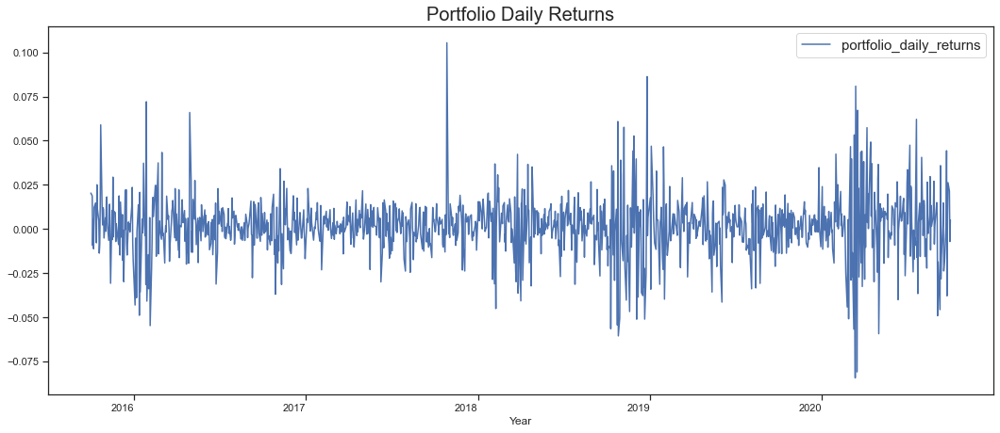

In [103]:
# Lets Plot the graph
plt.figure(figsize=(16,8))
stocks_returns['portfolio_daily_returns'].plot()
plt.title('Portfolio Daily Returns', fontsize = 20)
plt.legend(loc = 'best', fontsize = 15)
plt.xticks(rotation=0)
plt.xlabel("Year")
plt.show()

In [104]:
# Cumulative return from the portfolio

daily_cumulative_returns = (1+stocks_returns).cumprod()
daily_cumulative_returns.tail(5)

,Close_AMZN,Close_AAPL,Close_MSFT,Close_FB,Close_UNH,portfolio_daily_returns
Date,,,,,,
2020-09-24,5.799259,3.950356,4.554808,2.743595,2.509733,5.260109
2020-09-25,5.943943,4.098558,4.658597,2.801759,2.594117,5.398110
2020-09-28,6.095503,4.196386,4.694911,2.823749,2.600377,5.514322
2020-09-29,6.039484,4.164628,4.646043,2.878395,2.608267,5.475107
2020-09-30,6.046878,4.227414,4.714862,2.879604,2.673613,5.503136


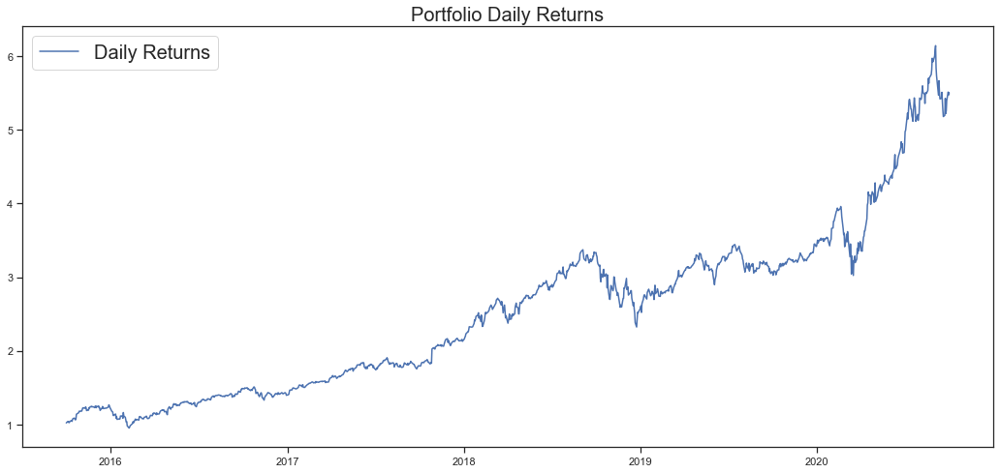

In [105]:
# Lets Plot the graph

plt.figure(figsize=(16,8))
plt.plot(daily_cumulative_returns['portfolio_daily_returns'], label = 'Daily Returns')
plt.title('Portfolio Daily Returns', fontsize = 20)
plt.legend(loc = 'best', fontsize = 20)
plt.show()

In [106]:
daily_cumulative_returns.to_csv("petercr.csv")

In [107]:
# Covariance matrix for the portfolio

# Removing the last column (Portfolio_Daily_Return) from our calculation.

covariance_matrix_portfolio = stocks_returns.iloc[:,:-1]
covariance_matrix_portfolio = (covariance_matrix_portfolio.cov())*252

covariance_matrix_portfolio

,Close_AMZN,Close_AAPL,Close_MSFT,Close_FB,Close_UNH
Close_AMZN,0.090671,0.051597,0.056626,0.060285,0.031256
Close_AAPL,0.051597,0.088398,0.058350,0.054279,0.041483
Close_MSFT,0.056626,0.058350,0.077524,0.055992,0.043228
Close_FB,0.060285,0.054279,0.055992,0.104402,0.036082
Close_UNH,0.031256,0.041483,0.043228,0.036082,0.079937


In [108]:
# Applying the matrix operations mentioned in the image above
portfolio_variance = np.dot(initial_weight.T,np.dot(covariance_matrix_portfolio, initial_weight))

# Standard deviation (risk of portfolio)
portfolio_risk = np.sqrt(portfolio_variance)
portfolio_risk*100

26.721755350652877

In [109]:
# Total ROI from the Portfolio
invested_amount=1000000
Cummulative_returns=daily_cumulative_returns['portfolio_daily_returns'][-1]
Expected_Return=invested_amount*Cummulative_returns
Expected_Return

5503136.369142954

In [110]:
Expected_Earning=Expected_Return - invested_amount
Expected_Earning

4503136.369142954

Mr.Peter Jyengar invests 1 Million Dollar on equities i.e the above Portfolio. Returns that he would fetch after 5 years is more than 5 Million Dollars with 4+ Million dollars of gain

## Conclusion:
1. In this Notebook we have explored stock prices of tech stocks, pharma stocks, Aviation stocks, finance stocks & market Index also. We have looked at the historical price of stock price.We have looked at the volume of stock traded.

2. We have looked at the daily Return of stock.We have done correlation between the stock prices.Microsoft and Amazon have highest daily price correlation.maximum daily fluctuation in ths stock is 8 % .In stock exchange there is a limit on per day fluctuation of stock.So if the stock reaches the threshold value then the trading of the stock is stopped for that day.

3. Stock with Low risk and high return are the best stock to buy. We can see that Amazon Stock has high risk and high returns.

## Exporting Dataframes in .csv file format

In [111]:
AllStocks.to_csv("AllStocks_df.csv")

In [112]:
newAnnualized.to_csv("newAnnualized.csv")

In [113]:
Annualized.to_csv("Annualized.csv")

In [114]:
AllStockvsIndex.to_csv("AllStockvsIndex.csv")

In [115]:
normalized_data.to_csv("AllStocks_Price_Normalized.csv")

In [116]:
AllStocks_Price_returns.to_csv("AllStocks_Price_returns.csv")